<span style="font-size:3em;font-weight:500">Стабилизация перевёрнутого маятника с неподвижной осью подвеса</span>

<span style="font-size:2em;font-weight:500">Расчётно-графическая работа для лабораторного практикума. Задания. Часть 1. Линейные и нелинейные стратегии управления</span>

**Автор: В. А. Костин**  

**2025 год**
$\newcommand{\ctg}{\mathop{\mathrm{ctg}}\nolimits}$
$\newcommand{\tg}{\mathop{\mathrm{tg}}\nolimits}$
$\newcommand{\arctg}{\mathop{\mathrm{arctg}}\nolimits}$
$\newcommand{\degree}{^{\circ}}$
$\renewcommand{\Re}{\mathop{\mathrm{Re}}\nolimits}$
$\newcommand{\D}{\mathrm{d}}$

# Задание 1. Инициализация параметров маятника

*Запишите в соответствующие переменные номер группы, фамилию, имя и отчество выполняющего работу.* *После этого запустите на выполнение изменённую ячейку и три следующие ячейки с кодом*. Запустить на выполнение текущую (в которой находится курсов) ячейку можно с помощью сочетания клавиш `Shift` и `Enter` или с помощью кнопки `Run` на панели инструментов. В результате выполнения этих ячеек будут исполнены подготовительные инструкции, подключены необходимые научные пакеты и вспомогательный модуль `control_theory`. Кроме этого будут созданы индивидуальные виртуальные маятники `p1` и `p2` со случайно сгенерированными параметрами (на основе предоставленных данных в качестве зерна случайной генерации). Для маятника `p1` управляющим воздействием является внешний момент сил, а для маятника `p2`&nbsp;— горизонтальная сила; оба маятника имеют одну и ту же частоту и коэффициент затухания. При перезапуске ядра Python необходимо каждый раз запускать эти четыре ячейки заново. Перед выходом или обновлением страницы используйте кнопку сохранения `Save and create checkpoint` (с пиктограммой, изображающей мягкий магнитный диск) или соответствующий пункт в меню `File` или сочетание клавиш `Control` и `S`.

## Решение

In [1]:
student_group = '3822Б1ПМоп1'
student_first_name = 'Василий'
student_father_name = 'Александрович'
student_last_name = 'Мерзляков'

## Подключение и настройка необходимых модулей, инициализация маятника со случайно сгенерированными параметрами

In [2]:
# Подключение объектов из библиотек numpy и matplotlib для более удобной
# дальнейшей интерактивной работы
from pylab import *

# Подключение объектов из вспомогательного модуля control_theory
from control_theory import *

# Импорт функции `HTML` для отображения произвольного кода HTML в выводе
# ячейки
from IPython.display import HTML, Video, Image

d:\lab_pendulum - 2025 - blank\control_theory.py:297: SyntaxWarning: invalid escape sequence '\p'
  def multiple_formatter(denominator=2, number=np.pi, latex='\pi'):


In [3]:
# Настройка вывода рисунков Matplotlib для интерактивной работы. Параметр
# inline указывает на то, что рисунки matplotlib должны быть встроены как
# растровые изображения, для интерактивных рисунков на javascript можно
# использовать параметр notebook вместо inline. Команда %matplotlib --list
# выводит список возможных типов вывода (бэкендов).
%matplotlib inline

# Настройка размеров и разрешения рисунков (960x720 по умолчанию, можно
# изменить для комфортной работы на мониторах с малым разрешением)
rcParams['figure.figsize'] = (9.6, 7.2) # Размер рисунков по умолчанию
rcParams['figure.dpi'] = 100 # Разрешение рисунков по умолчанию

rcParams['animation.embed_limit'] = 2.5 # Максимальный размер анимации в МБ
rcParams['animation.html'] = 'html5' # Представление анимаций matplotlib 

In [4]:
# Инициализация индивидуального маятника обучающегося
seed = (int(hashlib.md5((student_group
                         + student_first_name
                         + student_father_name
                         + student_last_name).encode('utf-8')).hexdigest(), 16)
        % 2**32)
np.random.seed(seed)

temp = np.random.rand(2)
p1 = PendulumTorque(0.3 + 1.5*temp[0], 0.01 + 0.1*temp[1]) 
p2 = PendulumHorizontalForce(0.3 + 1.5*temp[0], 0.01 + 0.1*temp[1])

# Вывод параметров маятника
print(p1, p2, sep='\n')

Pendulum controlled by applied torque: omega = 1.3, nu = 0.033
Pendulum controlled by applied horizontal force: omega = 1.3, nu = 0.033


# Задание 4. Динамика угла отклонения при стабилизации перевёрнутого маятника, управляемого моментом сил
<a id="sec:pr4"></a>

Для маятника `p1` (c управлением моментом сил) рассмотрите динамику стабилизации, построив временные зависимости угла отклонения $\varphi$ и управления $u$ для различных начальных условий и различных значений $k_0$ и $k_1$. *Приведите четыре примера (графики и анимации) стабилизации положения маятника с разными $k_0$ и $k_1$:*
- 1\) *начальный угол отклонения равен 60°, начальная скорость отсутствует, а маятник приходит к состоянию равновесия ангармонически, совершая не более одного переколебания;*
- 2\) *начальный угол отклонения равен 60°, начальная скорость отсутствует, а маятник приходит к состоянию равновесия квазигармонически, совершая экспоненциально затухающие колебания;*
- 3\) *начальный угол отклонения равен 60°, начальная скорость отсутствует, управление осуществляется только по углу (то есть $k_1 = 0$), а маятник приходит к состоянию равновесия ангармонически;*
- 4\) *начальный угол отклонения равен 540°, начальная скорость отсутствует.*
 
*Во всех примерах подбирайте интервал расчётного времени (параметр `T` функции `integrate`) так, чтобы процесс установления завершался около этого времени). Для выбранных значений $k_0$ и $k_1$ убедитесь в выполнении полученных в [задании 3](#sec:pr3)) условий и отметьте выбранные точки на карте устойчивости в плоскости $(k_0, k_1)$. Обратите внимание, сколько переколебаний и оборотов делает маятник в последних двух примерах. Поясните, почему число переколебаний может быть больше одного в случае, когда положение равновесия является устойчивым узлом.*

Пример использования функции `integrate` для расчёта маятника с управлением по углу можно увидеть в&nbsp;[приложении&nbsp;5.2](supplementary_materials.ipynb#sec:ex1).

## Пример без стабилизации верхнего положения равновесия

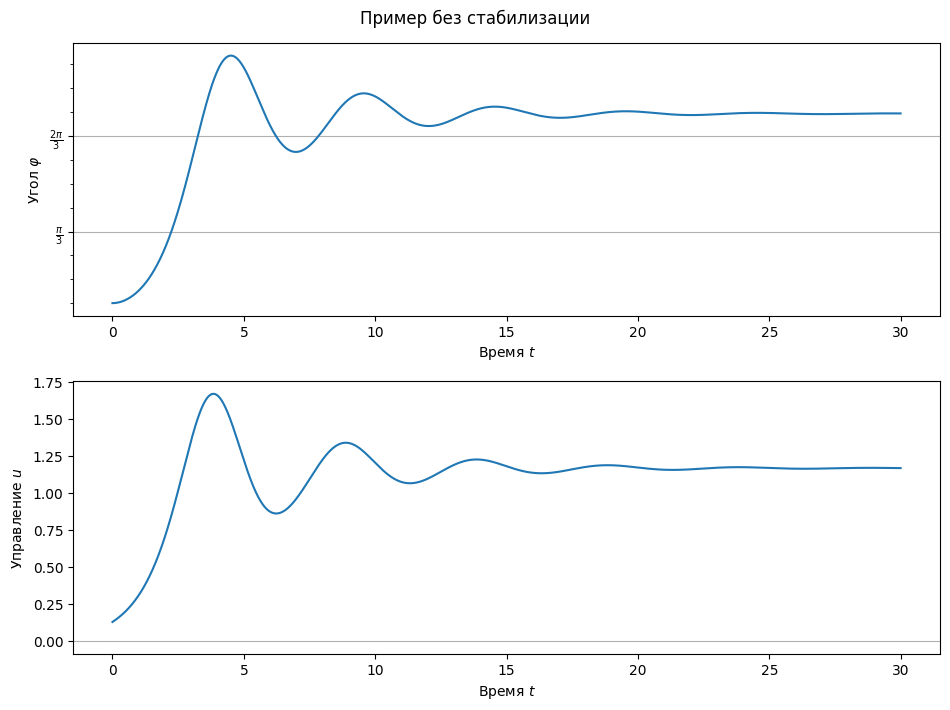

In [6]:
# Управление с k_0 = 0.5, k_1 = 0.4
c = LinearStateControl(2, 1, [0.5, 0.4])
# Численное интегрирование методом Рунге — Кутты с выводом управления
# начальным углом 15° и нулевой начальной скоростью
t, s, u = integrate(p1, c, x0=[pi/12, 0], v0=empty(0), dt=0.01, T=30, N=1,
                    return_control=True)

subplot(2, 1, 1)
plot(t, s[:, 0])
axis_pi_ticks(gca().yaxis, pi/3, pi/12, 3)
grid(axis='y')
xlabel(r'Время $t$')
ylabel(r'Угол $\varphi$')
subplot(2, 1, 2)
plot(t, u[:, 0])
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'Время $t$')
ylabel(r'Управление $u$')
suptitle(r'Пример без стабилизации')
tight_layout();
plt.show();

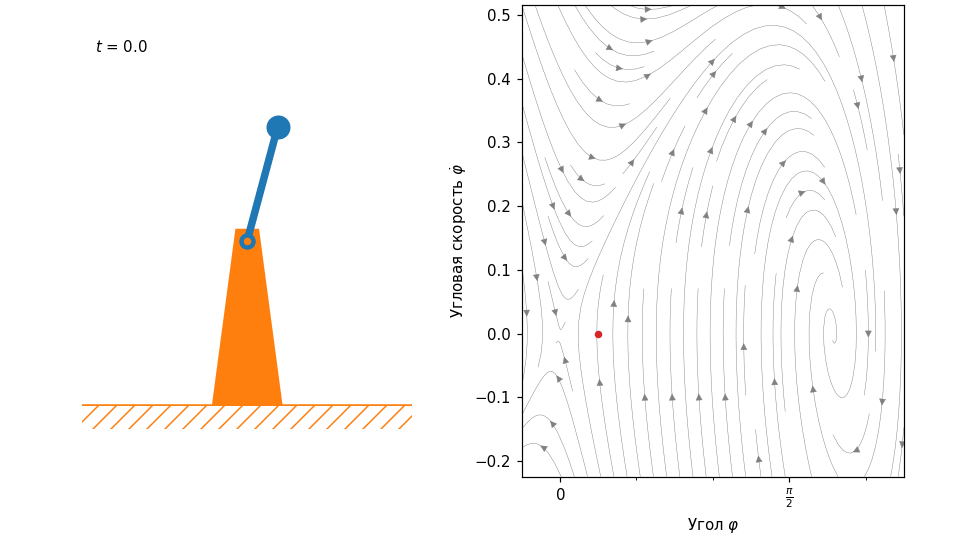

In [14]:
# Построение анимированного изображения gif
anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
                        cylinder_mode=False, spacing=30, invsec=1,
                        filename='temp/test4.gif')
Image('temp/test4.gif')

# Раскомментируйте для построения видео mp4 (ffmpeg должен быть установлен)
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1,
#                        filename='temp/test4.mp4')
#Video('temp/test4.mp4')

# Раскомментируйте для создания анимации на JavaScript
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1)
#HTML(anim.to_jshtml())

## Пример карты устойчивости для системы $\ddot x + a \dot x + b x = 0$ с четырьмя отмеченными точками

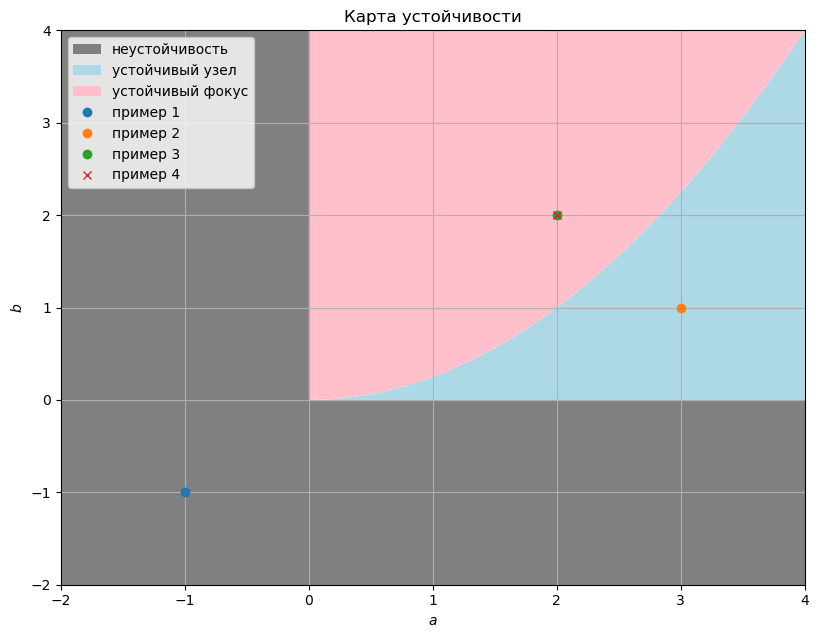

In [16]:
# Определение границ коробки осей
a_min = -2
a_max = 4
b_min = -2
b_max = 4

# Функция fill_between используется для закраски области между двумя кривыми,
# заданными посредством общего набора абсцисс и двумя наборами соответствующих
# этим абсциссам ординат
unstable = fill_between([a_min, 0, 0, a_max], [b_min, b_min, b_min, b_min],
                        [b_max, b_max, 0, 0], fc='grey', label='неустойчивость')

a = linspace(0, a_max, 201) # Эквидистантный массив от 0 до a_max из 101 точки
node = fill_between(a, 0, a**2/4, fc='lightblue', label='устойчивый узел')
focus = fill_between(a, a**2/4, b_max, fc='pink', label='устойчивый фокус')

# Точка в серой области
dot1, = plot([-1], [-1], 'o', label='пример 1')
# Точка в голубой области
dot2, = plot([3], [1], 'o', label='пример 2')
# Точка в розовой области
dot3, = plot([2], [2], 'o', label='пример 3')
# Та же точка в розовой области
dot4, = plot([2], [2], 'x', label='пример 4')

# Установка границ коробки осей
axis([a_min, a_max, b_min, b_max])

xlabel('$a$')
ylabel('$b$')

# Легенда карты
legend(loc='upper left')

grid()
title(r'Карта устойчивости');

## Решение

### 4.1. Ангармоническая стабилизация верхнего положения маятника

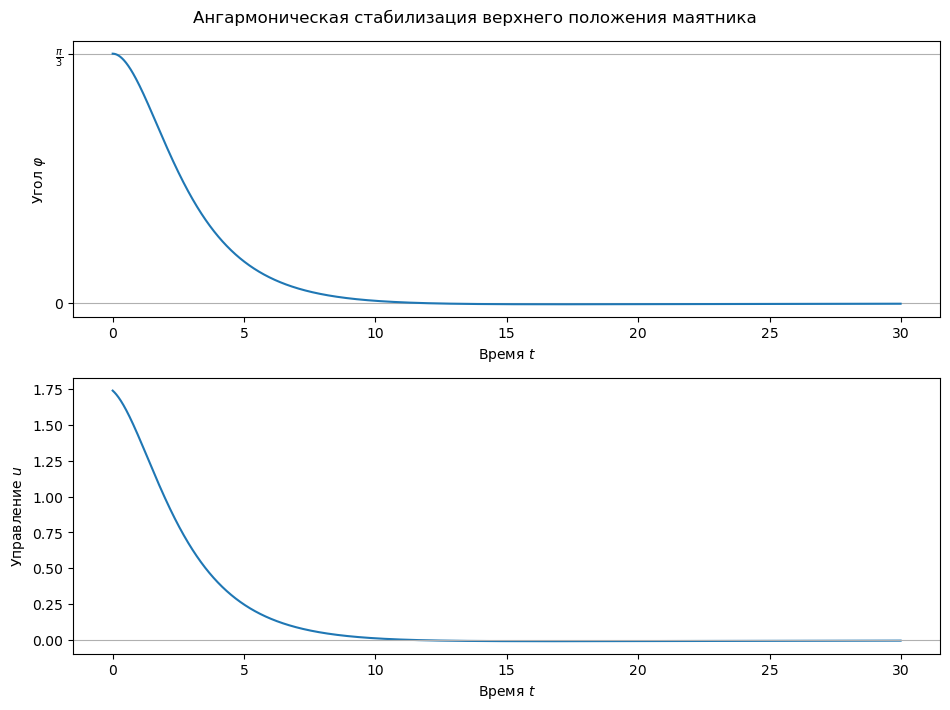

In [16]:
# Управление с k_0 = 1.7, k_1 = 0.5
c = LinearStateControl(2, 1, [1.66, 0.5])
# Численное интегрирование методом Рунге — Кутты с выводом управления
# начальным углом 15° и нулевой начальной скоростью
t, s, u = integrate(p1, c, x0=[pi/3, 0], v0=empty(0), dt=0.01, T=30, N=1,
                    return_control=True)

subplot(2, 1, 1)
plot(t, s[:, 0])
axis_pi_ticks(gca().yaxis, pi/3, pi/3, 3)
grid(axis='y')
xlabel(r'Время $t$')
ylabel(r'Угол $\varphi$')
subplot(2, 1, 2)
plot(t, u[:, 0])
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'Время $t$')
ylabel(r'Управление $u$')
suptitle(r'Ангармоническая стабилизация верхнего положения маятника')
tight_layout();
plt.show();

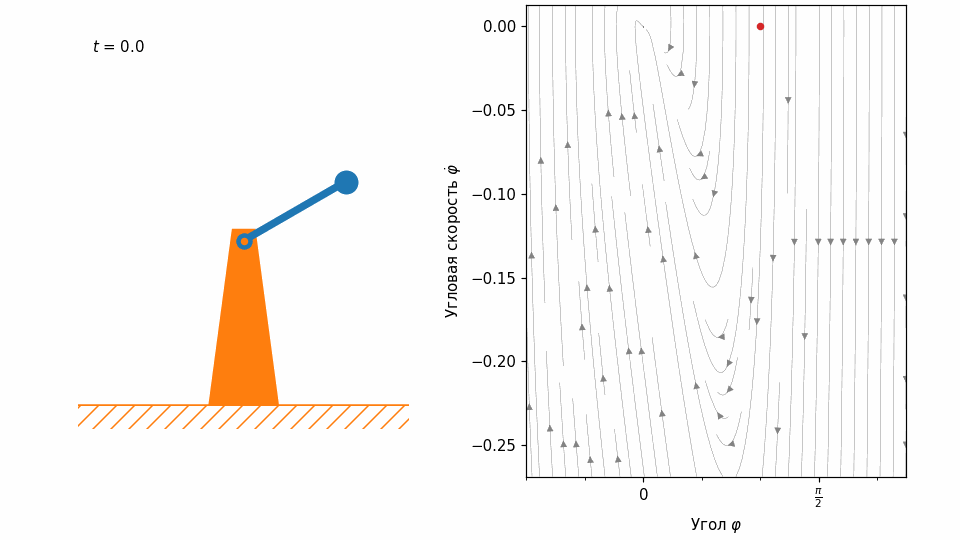

In [17]:
# Построение анимированного изображения gif
anim = animate_pendulum(t, s, phi_lims=(-pi/3, 3*pi/4), phase_portrait=[p1, c],
                        cylinder_mode=False, spacing=30, invsec=1,
                        filename='temp/test4.gif')
Image('temp/test4.gif')

# Раскомментируйте для построения видео mp4 (ffmpeg должен быть установлен)
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1,
#                        filename='temp/test4.mp4')
#Video('temp/test4.mp4')

# Раскомментируйте для создания анимации на JavaScript
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1)
#HTML(anim.to_jshtml())

### 4.2. Квазигармоническая стабилизация верхнего положения маятника

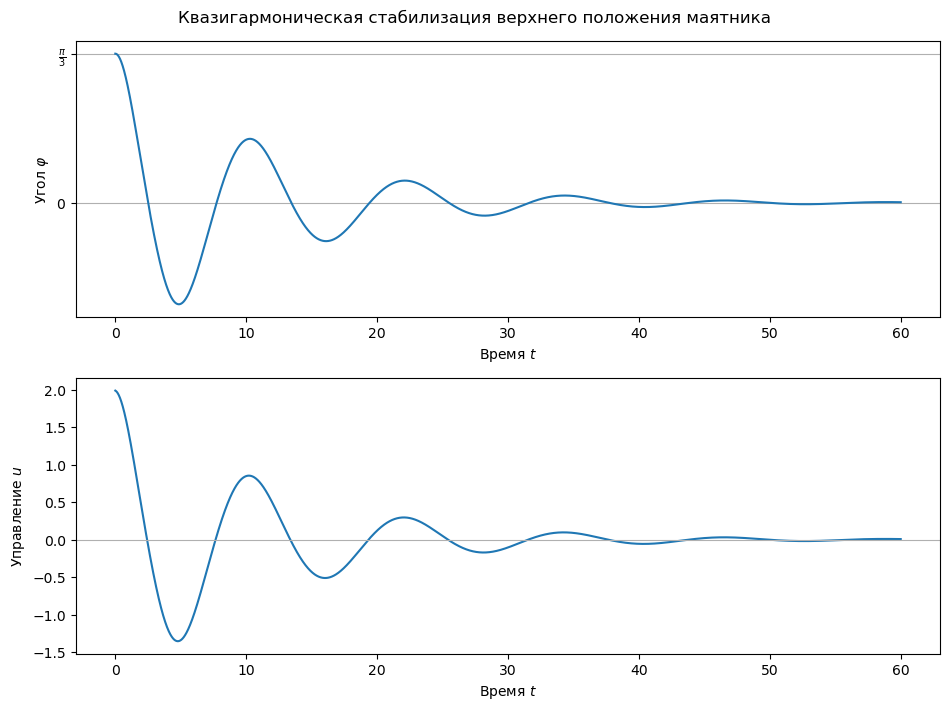

In [126]:
# Управление с k_0 = 1.9, k_1 = 0.15
c = LinearStateControl(2, 1, [1.9, 0.15])
# Численное интегрирование методом Рунге — Кутты с выводом управления
# начальным углом 15° и нулевой начальной скоростью
t, s, u = integrate(p1, c, x0=[pi/3, 0], v0=empty(0), dt=0.01, T=60, N=1,
                    return_control=True)

subplot(2, 1, 1)
plot(t, s[:, 0])
axis_pi_ticks(gca().yaxis, pi/3, pi/3, 3)
grid(axis='y')
xlabel(r'Время $t$')
ylabel(r'Угол $\varphi$')
subplot(2, 1, 2)
plot(t, u[:, 0])
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'Время $t$')
ylabel(r'Управление $u$')
suptitle(r'Квазигармоническая стабилизация верхнего положения маятника')
tight_layout();

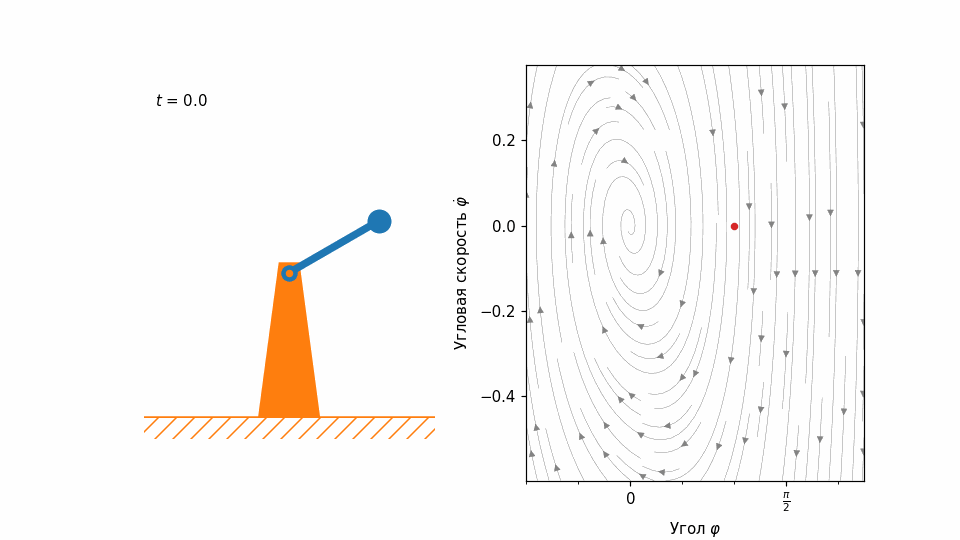

In [29]:
# Построение анимированного изображения gif
anim = animate_pendulum(t, s, phi_lims=(-pi/3, 3*pi/4), phase_portrait=[p1, c],
                        cylinder_mode=False, spacing=30, invsec=1,
                        filename='temp/test4.gif')
Image('temp/test4.gif')

# Раскомментируйте для построения видео mp4 (ffmpeg должен быть установлен)
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1,
#                        filename='temp/test4.mp4')
#Video('temp/test4.mp4')

# Раскомментируйте для создания анимации на JavaScript
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1)
#HTML(anim.to_jshtml())

### 4.3. Ангармоническая стабилизация верхнего положения маятника посредством управления только по углу

In [19]:
p1.nu**2/4 + p1.omega**2

1.629298828637703

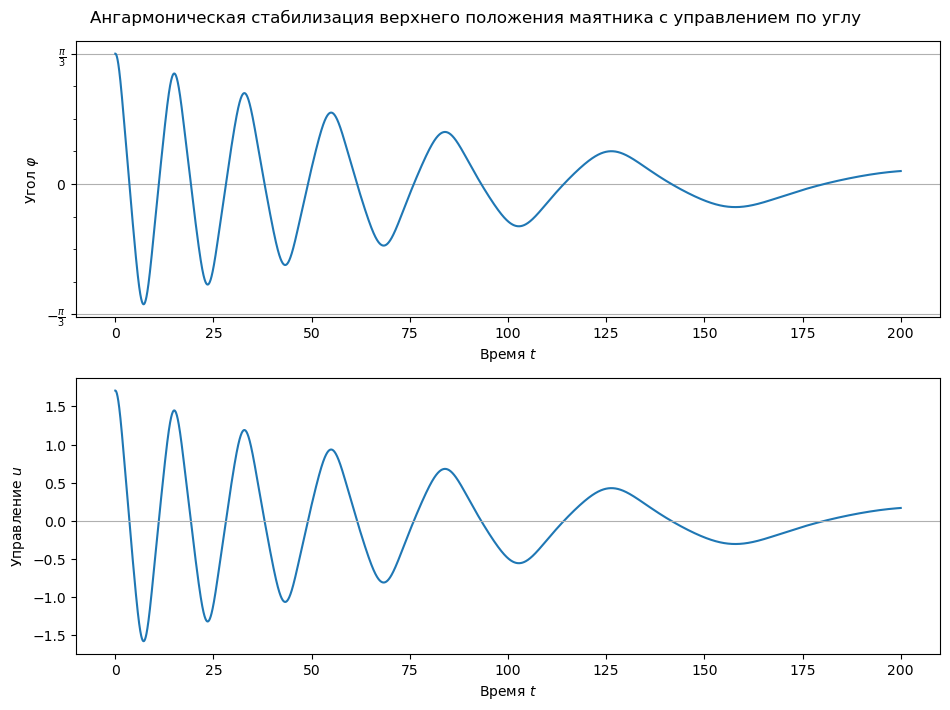

In [23]:
# Управление с k_0 = 0.5, k_1 = 0.0
c = LinearStateControl(2, 1, [1.629298828637703, 0.0])
# Численное интегрирование методом Рунге — Кутты с выводом управления
# начальным углом 60° и нулевой начальной скоростью
t, s, u = integrate(p1, c, x0=[pi/3, 0], v0=empty(0), dt=0.01, T=200, N=1,
                    return_control=True)

subplot(2, 1, 1)
plot(t, s[:, 0])
axis_pi_ticks(gca().yaxis, pi/3, pi/12, 3)
grid(axis='y')
xlabel(r'Время $t$')
ylabel(r'Угол $\varphi$')
subplot(2, 1, 2)
plot(t, u[:, 0])
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'Время $t$')
ylabel(r'Управление $u$')
suptitle(r'Ангармоническая стабилизация верхнего положения маятника с управлением по углу')
tight_layout();
plt.show();

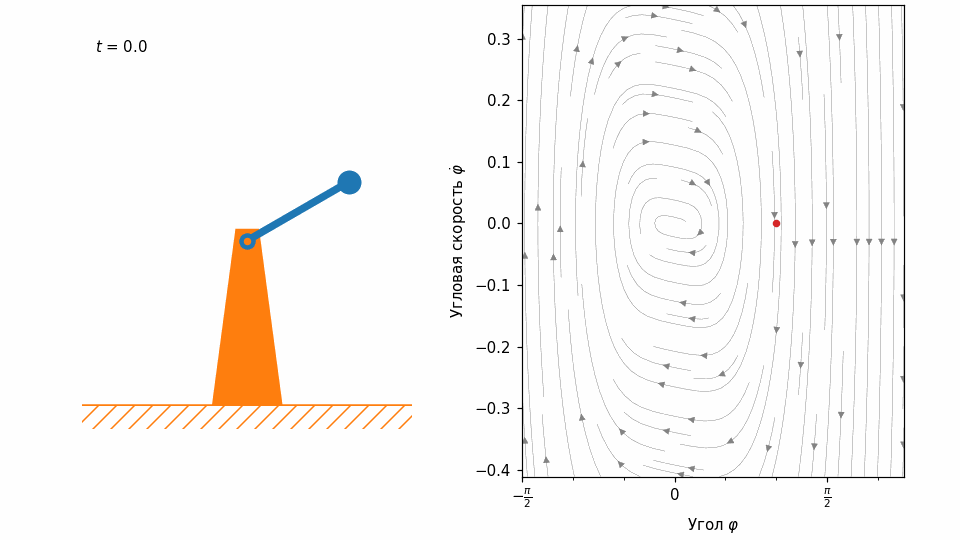

In [24]:
# Построение анимированного изображения gif
anim = animate_pendulum(t, s, phi_lims=(-pi/2, 3*pi/4), phase_portrait=[p1, c],
                        cylinder_mode=False, spacing=30, invsec=1,
                        filename='temp/test4.gif')
Image('temp/test4.gif')

# Раскомментируйте для построения видео mp4 (ffmpeg должен быть установлен)
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1,
#                        filename='temp/test4.mp4')
#Video('temp/test4.mp4')

# Раскомментируйте для создания анимации на JavaScript
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1)
#HTML(anim.to_jshtml())

### 4.4 Стабилизация верхнего положения маятника из большого начального отклонения

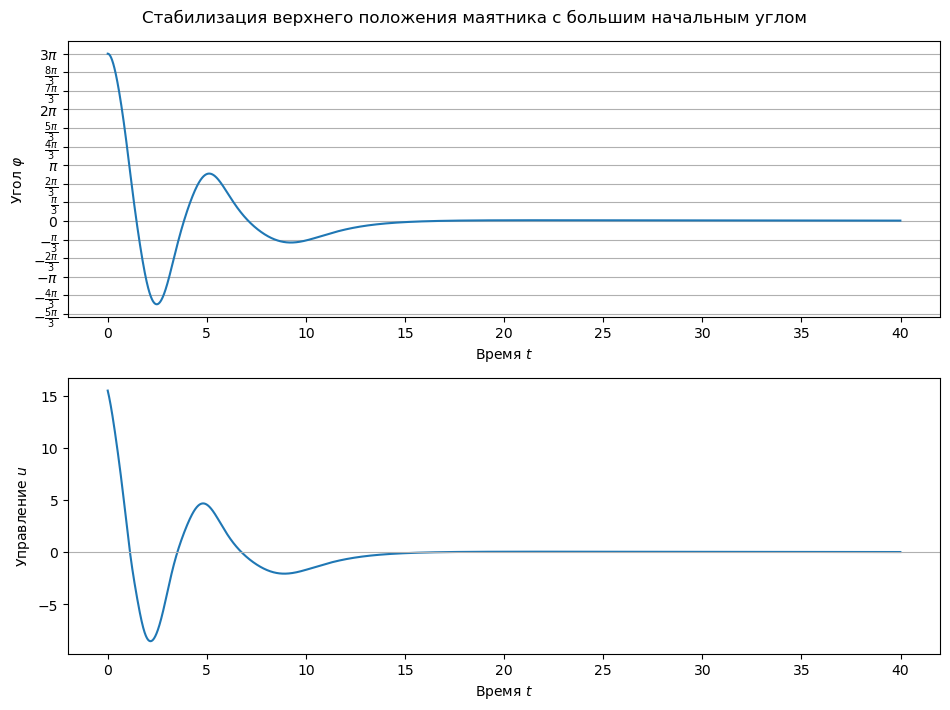

In [128]:
# Управление с k_0 = 0.5, k_1 = 0.0
c = LinearStateControl(2, 1, [1.65, 0.511])
# Численное интегрирование методом Рунге — Кутты с выводом управления
# начальным углом 540° и нулевой начальной скоростью
t, s, u = integrate(p1, c, x0=[3*pi, 0], v0=empty(0), dt=0.01, T=40, N=1,
                    return_control=True)

subplot(2, 1, 1)
plot(t, s[:, 0])
axis_pi_ticks(gca().yaxis, pi/3, pi/3, 3)
grid(axis='y')
xlabel(r'Время $t$')
ylabel(r'Угол $\varphi$')
subplot(2, 1, 2)
plot(t, u[:, 0])
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'Время $t$')
ylabel(r'Управление $u$')
suptitle(r'Стабилизация верхнего положения маятника с большим начальным углом')
tight_layout();

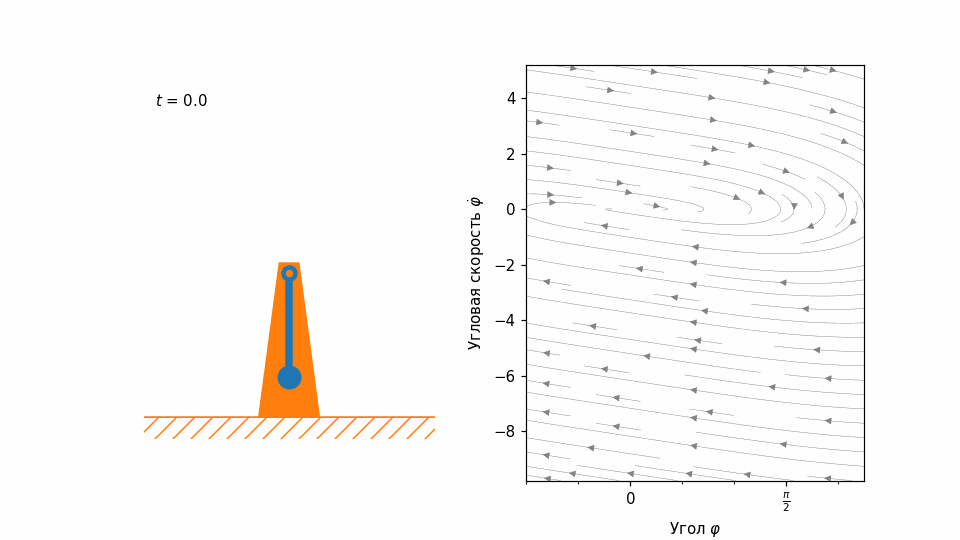

In [75]:
# Построение анимированного изображения gif
anim = animate_pendulum(t, s, phi_lims=(-pi/3, 3*pi/4), phase_portrait=[p1, c],
                        cylinder_mode=False, spacing=30, invsec=1,
                        filename='temp/test4.gif')
Image('temp/test4.gif')

# Раскомментируйте для построения видео mp4 (ffmpeg должен быть установлен)
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1,
#                        filename='temp/test4.mp4')
#Video('temp/test4.mp4')

# Раскомментируйте для создания анимации на JavaScript
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1)
#HTML(anim.to_jshtml())

### 4.5. Карта устойчивости с отмеченными точками, соответствующими примерам 4.1 — 4.4

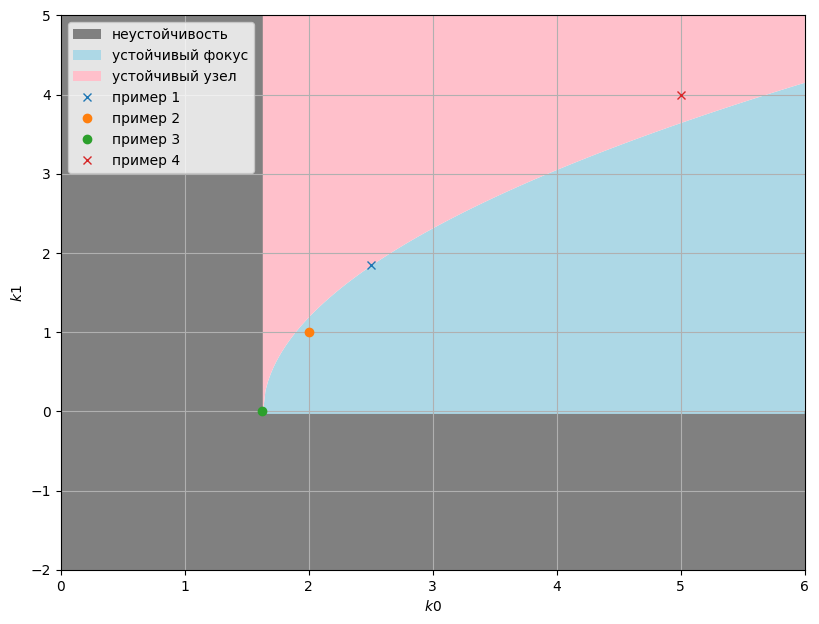

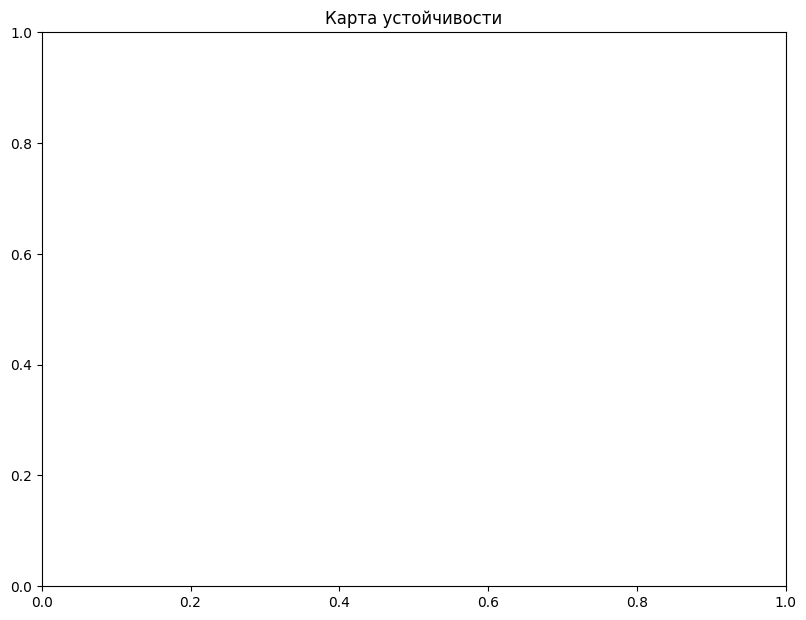

In [7]:
# Вставьте и запустите код для построения карты устойчивости с отмеченными
# точками
# Определение границ коробки осей
k0_min = 0
k0_max = 6
k1_min = -2
k1_max = 5

omega = p1.omega
nu = p1.nu
# Функция fill_between используется для закраски области между двумя кривыми,
# заданными посредством общего набора абсцисс и двумя наборами соответствующих
# этим абсциссам ординат
unstable = fill_between([k0_min, omega**2, omega**2, k0_max], [k1_min, k1_min, k1_min, k1_min],
                        [k1_max, k1_max, 0, 0], fc='grey', label='неустойчивость')

a = linspace(omega**2, k0_max, 201) # Эквидистантный массив от 0 до a_max из 101 точки
node = fill_between(a, -nu, 2*sqrt(a-omega**2)-nu, fc='lightblue', label='устойчивый фокус')
focus = fill_between(a, 2*sqrt(a-omega**2)-nu, k1_max, fc='pink', label='устойчивый узел')

# Точка в серой области 4.1
dot1, = plot([2.5], [1.85], 'x', label='пример 1')
# Точка в голубой области 4.2
dot2, = plot([2], [1], 'o', label='пример 2')
# Точка в розовой области 4.3
dot3, = plot([1.62], [0], 'o', label='пример 3')
# Та же точка в розовой области 4.4
dot4, = plot([5], [4], 'x', label='пример 4')

# Установка границ коробки осей
axis([k0_min, k0_max, k1_min, k1_max])
xlabel('$k0$')
ylabel('$k1$')
# Легенда карты
legend(loc='upper left')
grid()
plt.show()
title(r'Карта устойчивости');

### 4.6. Пояснение о числе переколебаний в примере с ангармоническим установлением и управлением только по углу

Параметр k0 в уравнении U = k0*phi зависит от параметров omega и nu. Параметр k0 должен находиться в промежутке между значениями omega^2 и omega^2 + (nu^2)/4. Подобранный параметр показывает, что ангармонические колебания выполняются, хотя и требуется больше времени, чтобы точка достигла состояния равновесия.

# Задание 5. Динамика угла отклонения при стабилизации перевёрнутого маятника, управляемого горизонтальной силой
<a id="sec:pr5"></a>

Теперь следует попытаться стабилизировать маятник `p2` (c управлением горизонтальной силой). *Попробуйте построить четыре примера из [задания 4](#sec:pr4). Сначала используйте те же самые четыре набора начальных условий и значений коэффициентов $k_0$ и $k_1$ стратегии управления, что и в [задании 4](#sec:pr4). Если эти наборы не позволяют достигнуть необходимых условий измените значения коэффициентов стратегии управления (в примерах 1, 2 и 4) или начального угла отклонения (в примере 3). Поясните, как и почему пришлось изменить значения коэффициентов и начальных условий. Приведите также пример, когда верхнее положение является устойчивым, но маятник к нему не приходит. Поясните, почему это случается для маятника `p2`, но не имело места при рассмотрении маятника `p1`. Также к в [задания 4](#sec:pr4) для выбранных значений $k_0$ и $k_1$ убедитесь в выполнении полученных в [задании 3](#sec:pr3)) условий и отметьте выбранные точки на карте устойчивости в плоскости $(k_0, k_1)$.*

Пример использования функции `integrate` для расчёта маятника с управлением по углу можно увидеть в&nbsp;[приложении&nbsp;5.2](supplementary_materials.ipynb#sec:ex1).

## Решение

### 5.1. Ангармоническая стабилизация верхнего положения маятника

In [66]:
k1=2.2
print(p2.omega**2)
print(((k1 - p2.nu)**2 + 4*p2.omega**2)/4)

1.6290334432334923
2.803459390076533


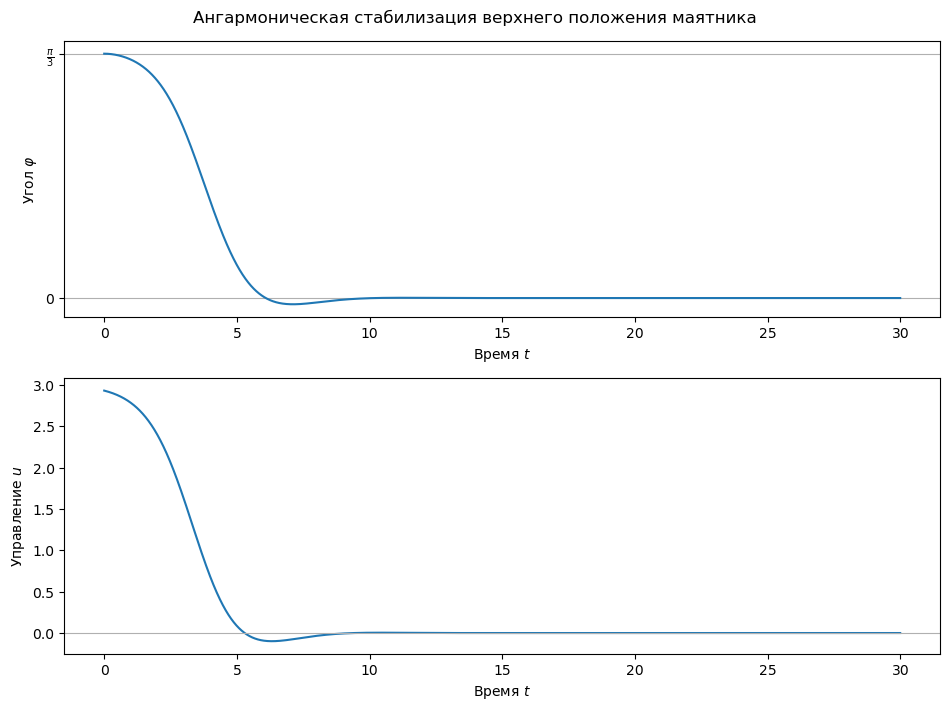

In [13]:
# Управление с k_0 = 2.8, k_1 = 1.5
c = LinearStateControl(2, 1, [2.8, 1.5])
# Численное интегрирование методом Рунге — Кутты с выводом управления
# начальным углом 60° и нулевой начальной скоростью
t, s, u = integrate(p2, c, x0=[pi/3, 0], v0=empty(0), dt=0.01, T=30, N=1,
                    return_control=True)

subplot(2, 1, 1)
plot(t, s[:, 0])
axis_pi_ticks(gca().yaxis, pi/3, pi/3, 3)
grid(axis='y')
xlabel(r'Время $t$')
ylabel(r'Угол $\varphi$')
subplot(2, 1, 2)
plot(t, u[:, 0])
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'Время $t$')
ylabel(r'Управление $u$')
suptitle(r'Ангармоническая стабилизация верхнего положения маятника')
tight_layout();
plt.show();

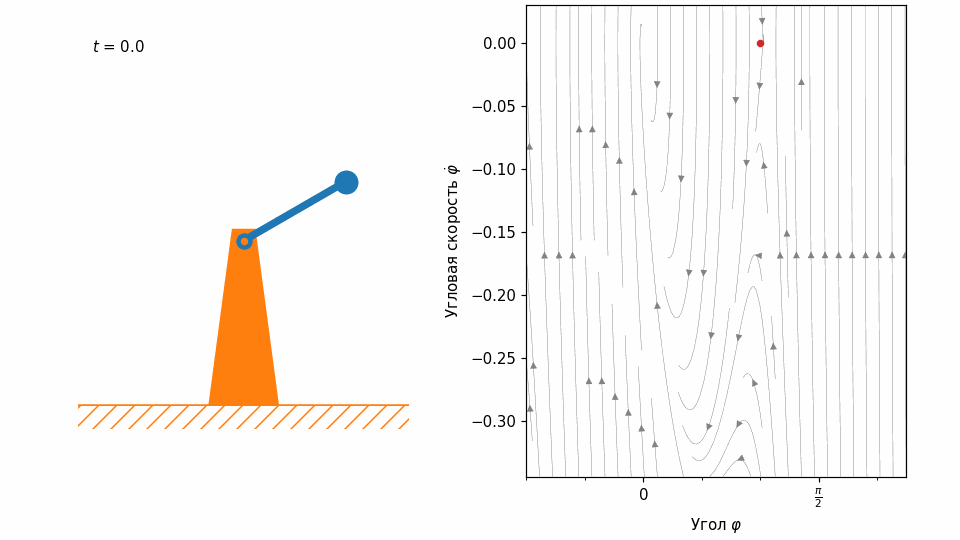

In [112]:
# Построение анимированного изображения gif
anim = animate_pendulum(t, s, phi_lims=(-pi/3, 3*pi/4), phase_portrait=[p2, c],
                        cylinder_mode=False, spacing=30, invsec=1,
                        filename='temp/test4.gif')
Image('temp/test4.gif')

# Раскомментируйте для построения видео mp4 (ffmpeg должен быть установлен)
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1,
#                        filename='temp/test4.mp4')
#Video('temp/test4.mp4')

# Раскомментируйте для создания анимации на JavaScript
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1)
#HTML(anim.to_jshtml())

### 5.2. Квазигармоническая стабилизация верхнего положения маятника

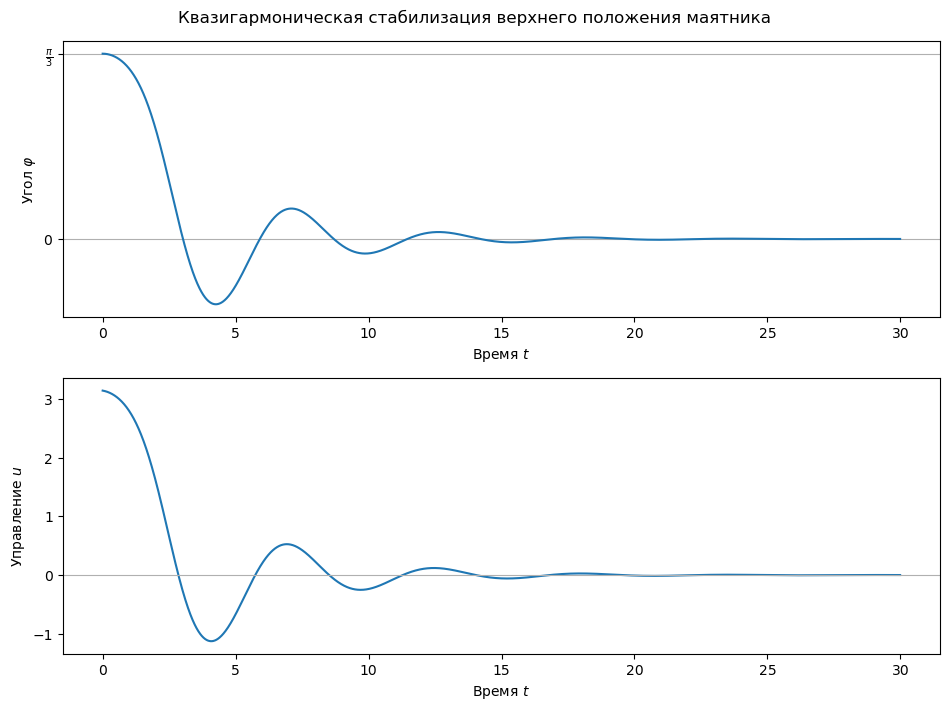

In [14]:
# Управление с k_0 = 3, k_1 = 0.5
c = LinearStateControl(2, 1, [3, 0.5])
# Численное интегрирование методом Рунге — Кутты с выводом управления
# начальным углом 60° и нулевой начальной скоростью
t, s, u = integrate(p2, c, x0=[pi/3, 0], v0=empty(0), dt=0.01, T=30, N=1,
                    return_control=True)

subplot(2, 1, 1)
plot(t, s[:, 0])
axis_pi_ticks(gca().yaxis, pi/3, pi/3, 3)
grid(axis='y')
xlabel(r'Время $t$')
ylabel(r'Угол $\varphi$')
subplot(2, 1, 2)
plot(t, u[:, 0])
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'Время $t$')
ylabel(r'Управление $u$')
suptitle(r'Квазигармоническая стабилизация верхнего положения маятника')
tight_layout();
plt.show();

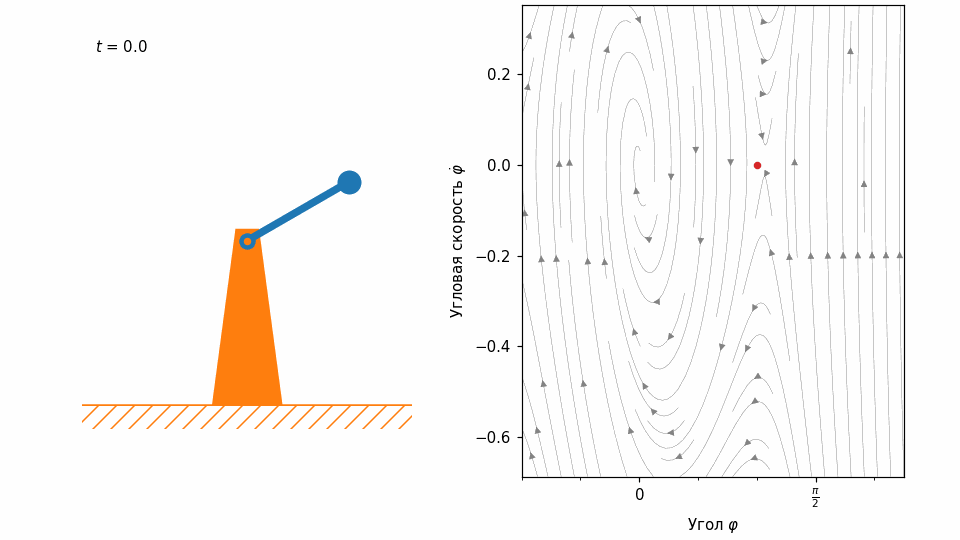

In [114]:
# Построение анимированного изображения gif
anim = animate_pendulum(t, s, phi_lims=(-pi/3, 3*pi/4), phase_portrait=[p2, c],
                        cylinder_mode=False, spacing=30, invsec=1,
                        filename='temp/test4.gif')
Image('temp/test4.gif')

# Раскомментируйте для построения видео mp4 (ffmpeg должен быть установлен)
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1,
#                        filename='temp/test4.mp4')
#Video('temp/test4.mp4')

# Раскомментируйте для создания анимации на JavaScript
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1)
#HTML(anim.to_jshtml())

### 5.3. Ангармоническая стабилизация верхнего положения маятника посредством управления только по углу

In [222]:
(p2.omega**2 + p1.nu**2)**2 

2.6572096596342147

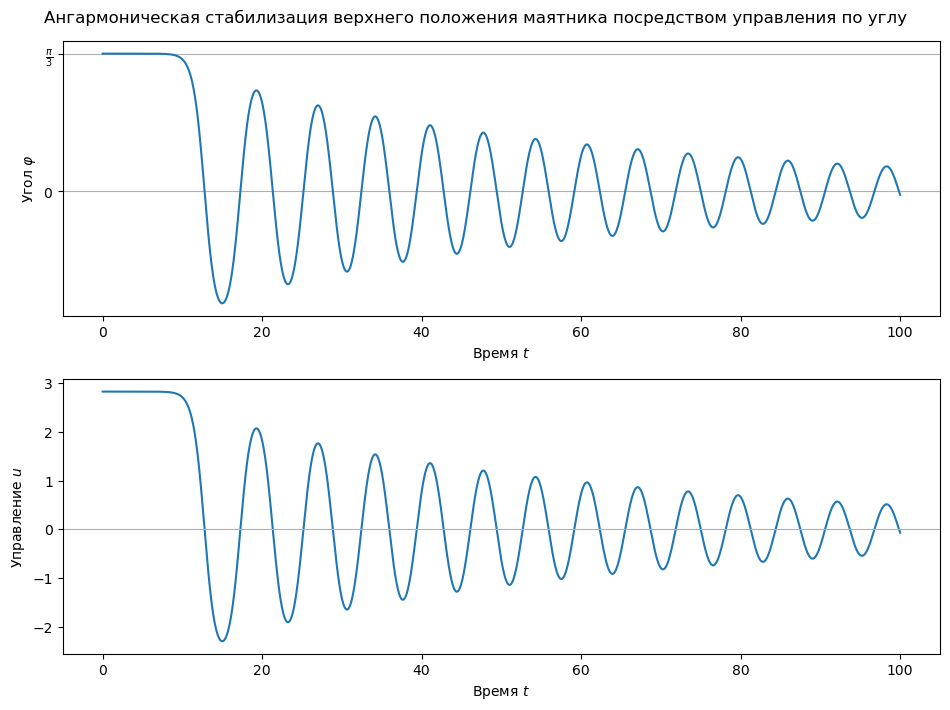

In [301]:
# Управление с k_0 = 3, k_1 = 0.5
c = LinearStateControl(2, 1, [2.6944, 0.0])
# Численное интегрирование методом Рунге — Кутты с выводом управления
# начальным углом 60° и нулевой начальной скоростью
t, s, u = integrate(p2, c, x0=[pi/3, 0], v0=empty(0), dt=0.01, T=100, N=1,
                    return_control=True)

subplot(2, 1, 1)
plot(t, s[:, 0])
axis_pi_ticks(gca().yaxis, pi/3, pi/3, 3)
grid(axis='y')
xlabel(r'Время $t$')
ylabel(r'Угол $\varphi$')
subplot(2, 1, 2)
plot(t, u[:, 0])
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'Время $t$')
ylabel(r'Управление $u$')
suptitle(r'Ангармоническая стабилизация верхнего положения маятника посредством управления по углу')
tight_layout();
plt.show();

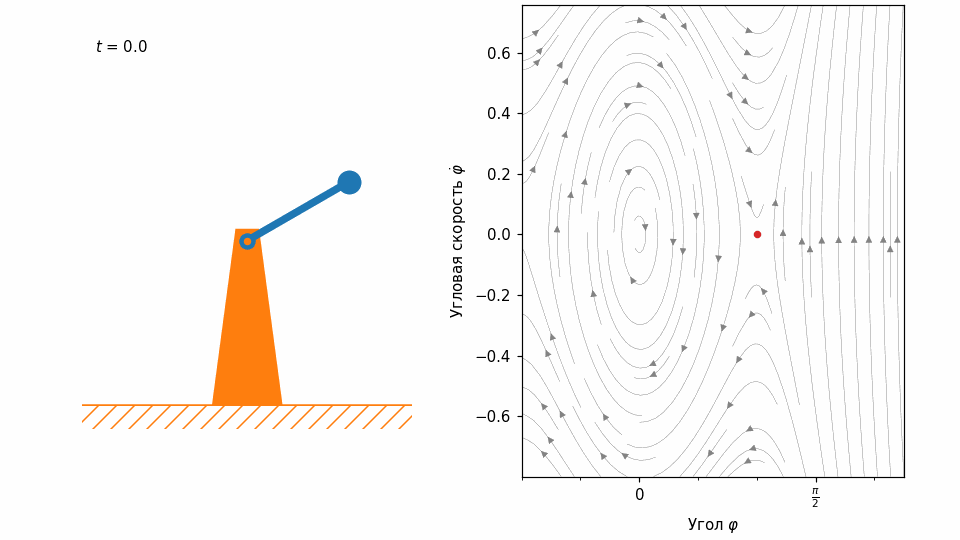

In [261]:
# Построение анимированного изображения gif
anim = animate_pendulum(t, s, phi_lims=(-pi/3, 3*pi/4), phase_portrait=[p2, c],
                        cylinder_mode=False, spacing=30, invsec=1,
                        filename='temp/test4.gif')
Image('temp/test4.gif')

# Раскомментируйте для построения видео mp4 (ffmpeg должен быть установлен)
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1,
#                        filename='temp/test4.mp4')
#Video('temp/test4.mp4')

# Раскомментируйте для создания анимации на JavaScript
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1)
#HTML(anim.to_jshtml())

### 5.4. Стабилизация верхнего положения маятника из большого начального отклонения

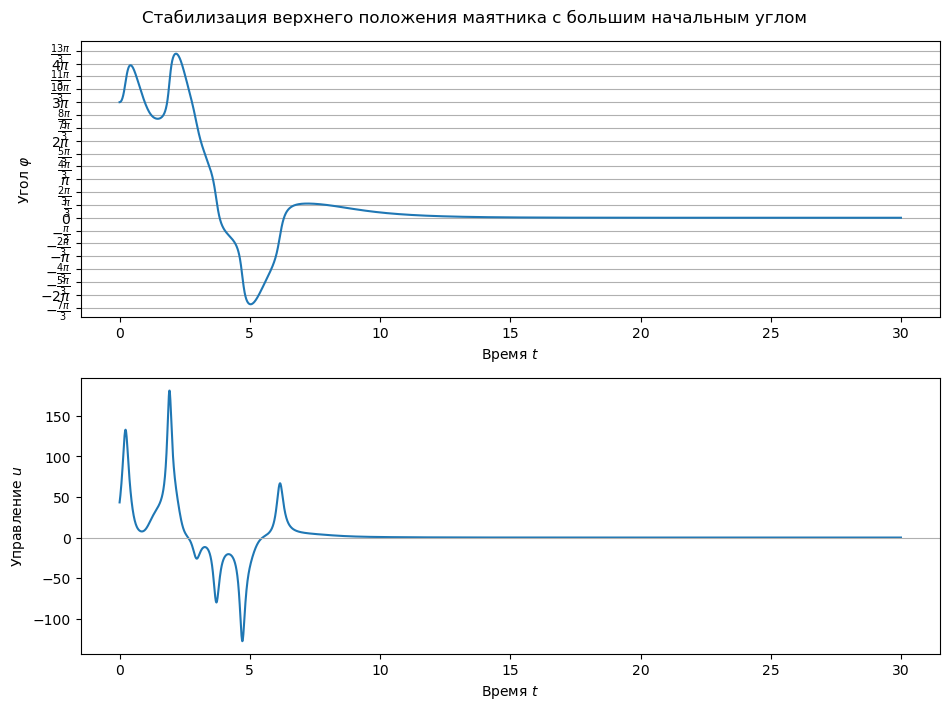

In [7]:
# Управление с k_0 = 0.5, k_1 = 0.0
c = LinearStateControl(2, 1, [4.6, 6])
# Численное интегрирование методом Рунге — Кутты с выводом управления
# начальным углом 540° и нулевой начальной скоростью
t, s, u = integrate(p2, c, x0=[3*pi, 0], v0=empty(0), dt=0.01, T=30, N=1,
                    return_control=True)

subplot(2, 1, 1)
plot(t, s[:, 0])
axis_pi_ticks(gca().yaxis, pi/3, pi/3, 3)
grid(axis='y')
xlabel(r'Время $t$')
ylabel(r'Угол $\varphi$')
subplot(2, 1, 2)
plot(t, u[:, 0])
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'Время $t$')
ylabel(r'Управление $u$')
suptitle(r'Стабилизация верхнего положения маятника с большим начальным углом')
tight_layout();
plt.show();

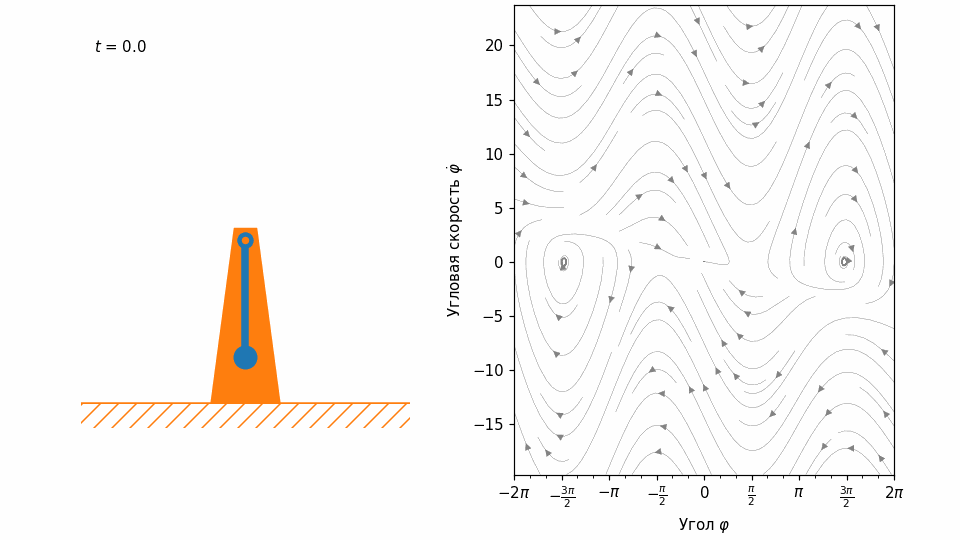

In [8]:
# Построение анимированного изображения gif
anim = animate_pendulum(t, s, phi_lims=(-2*pi, 2*pi), phase_portrait=[p2, c],
                        cylinder_mode=False, spacing=30, invsec=1,
                        filename='temp/test4.gif')
Image('temp/test4.gif')

# Раскомментируйте для построения видео mp4 (ffmpeg должен быть установлен)
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1,
#                        filename='temp/test4.mp4')
#Video('temp/test4.mp4')

# Раскомментируйте для создания анимации на JavaScript
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1)
#HTML(anim.to_jshtml())

### 5.5. Маятник, не приходящий в верхнее устойчивое положение

In [304]:
p2.omega**2

1.6290334432334923

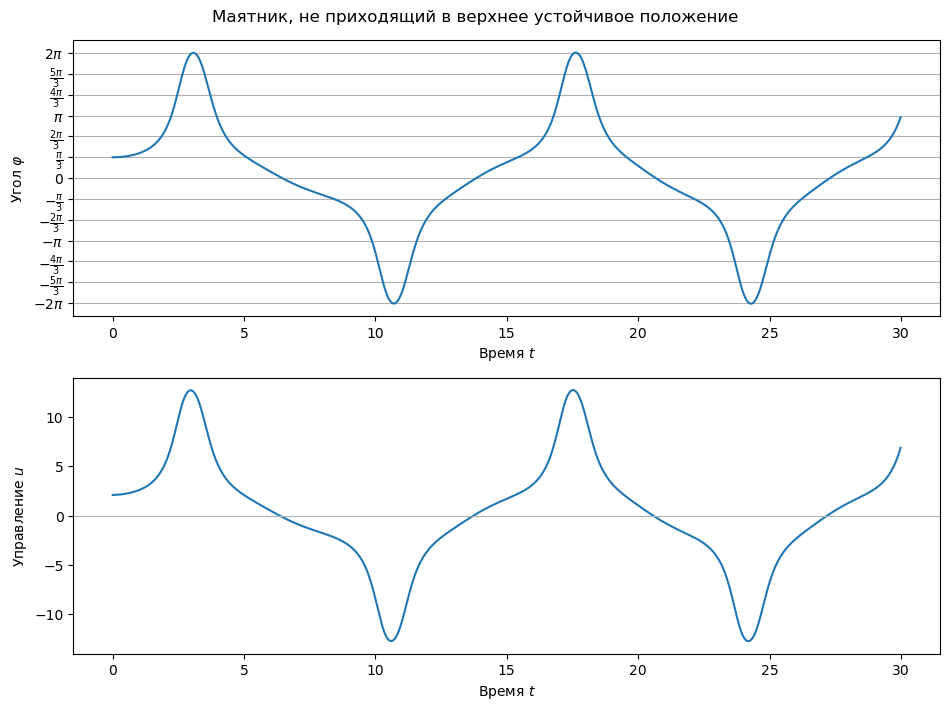

In [279]:
# Управление с k_0 = 0.5, k_1 = 0.0
c = LinearStateControl(2, 1, [2, 0.2])
# Численное интегрирование методом Рунге — Кутты с выводом управления
# начальным углом 60
t, s, u = integrate(p2, c, x0=[pi/3, 0], v0=empty(0), dt=0.01, T=30, N=1,
                    return_control=True)

subplot(2, 1, 1)
plot(t, s[:, 0])
axis_pi_ticks(gca().yaxis, pi/3, pi/3, 3)
grid(axis='y')
xlabel(r'Время $t$')
ylabel(r'Угол $\varphi$')
subplot(2, 1, 2)
plot(t, u[:, 0])
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'Время $t$')
ylabel(r'Управление $u$')
suptitle(r'Маятник, не приходящий в верхнее устойчивое положение')
tight_layout();
plt.show();

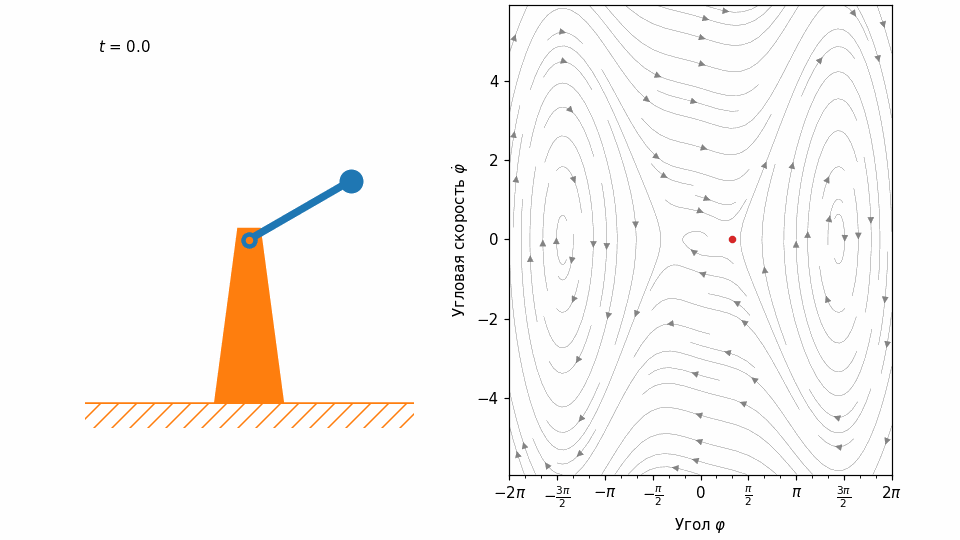

In [280]:
# Построение анимированного изображения gif
anim = animate_pendulum(t, s, phi_lims=(-2*pi, 2*pi), phase_portrait=[p2, c],
                        cylinder_mode=False, spacing=15, invsec=1,
                        filename='temp/test4.gif')
Image('temp/test4.gif')

# Раскомментируйте для построения видео mp4 (ffmpeg должен быть установлен)
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1,
#                        filename='temp/test4.mp4')
#Video('temp/test4.mp4')

# Раскомментируйте для создания анимации на JavaScript
#anim = animate_pendulum(t, s, phi_lims=(-pi/12, 3*pi/4), phase_portrait=[p1, c],
#                        cylinder_mode=False, spacing=30, invsec=1)
#HTML(anim.to_jshtml())

### 5.6. Карта устойчивости с отмеченными точками, соответствующими примерам 5.1 — 5.5

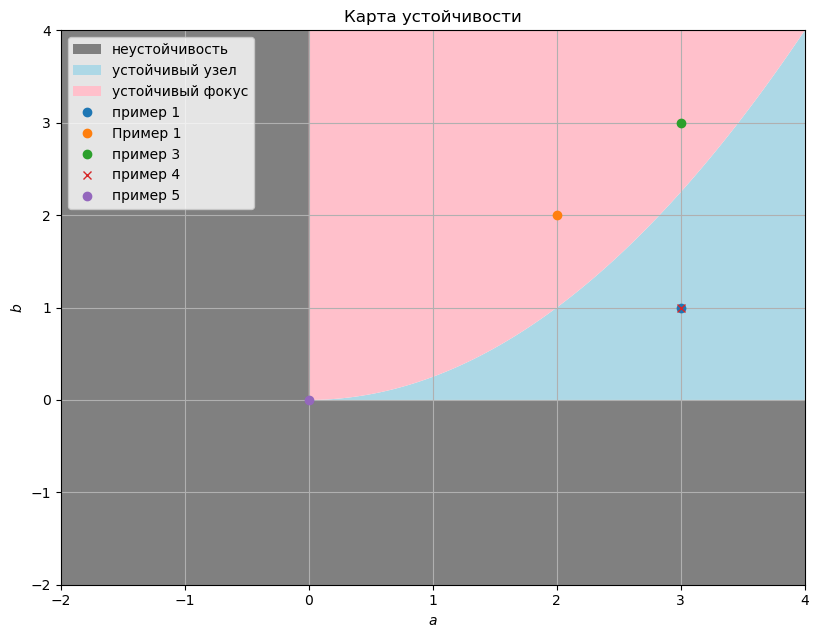

In [61]:
# Определение границ коробки осей
a_min = -2
a_max = 4
b_min = -2
b_max = 4

# Функция fill_between используется для закраски области между двумя кривыми,
# заданными посредством общего набора абсцисс и двумя наборами соответствующих
# этим абсциссам ординат
unstable = fill_between([a_min, 0, 0, a_max], [b_min, b_min, b_min, b_min],
                        [b_max, b_max, 0, 0], fc='grey', label='неустойчивость')

a = linspace(0, a_max, 201) # Эквидистантный массив от 0 до a_max из 101 точки
node = fill_between(a, 0, a**2/4, fc='lightblue', label='устойчивый узел')
focus = fill_between(a, a**2/4, b_max, fc='pink', label='устойчивый фокус')

# Точка в серой области
dot3, = plot([3], [1], 'o', label='пример 1')
# Точка в голубой области
dot1, = plot([2], [2], 'o', label='Пример 1')
# Точка в розовой области
dot2, = plot([3], [3], 'o', label='пример 3')
# Та же точка в розовой области
dot4, = plot([3], [1], 'x', label='пример 4')
dot5, = plot([0], [0], 'o', label='пример 5')

# Установка границ коробки осей
axis([a_min, a_max, b_min, b_max])

xlabel('$a$')
ylabel('$b$')

# Легенда карты
legend(loc='upper left')

grid()
title(r'Карта устойчивости');
plt.show();

### 5.7. Пояснение, как и почему пришлось изменять коэффициенты $k_{0, 1}$ или начальные условия в примерах 5.1 — 5.4 и почему пример 5.5 возможен для маятника `p2`, но не для `p1`

Изменять коэффициенты k0, k1 пришлось, потому что различаются принципы воздействия на маятник при управлении моментом силы и горизонтальной силой.
Момент силы даёт прямое управление, поэтому можно брать меньшие k0, k1.
Горизонтальная сила действует косвенно, действуя на точку подвеса, а не на прямую на маятник, поэтому требуются большие k0, k1.


Горизонтальное управление не даёт момент напрямую → устойчивость верхней точки может быть недостаточной.
Может возникать предельный цикл, если управление не затухает колебания.
Система может иметь несколько устойчивых состояний, что мешает стабилизации.

# Задание 6. Фазовые портреты нелинейной системы
<a id="sec:pr6"></a>

Чтобы разобраться в различиях межджу маятниками `p1` и `p2` можно обратиться к фазовым портретам соответствующих замкнутых систем. *С помощью функции `streamplot` библиотеки `matplotlib` постройте на плоскости $(\varphi, \dot\varphi)$ пять фазовых портретов замкнутых нелинейных систем: один потрет с управлением $u = \frac{\Omega^2}2 \varphi$ для маятника `p1` и по два портрета для каждого из маятников с управлением вида $u = k_0 \varphi$ с двумя различными значениями $k_0$: одно отвечает устойчивому узлу в $(\varphi, \dot\varphi) = (0, 0)$, а другое&nbsp;— устойчивому фокусу. Отметьте различными цветами все устойчивые и неустойчивые состояния равновесия. Для сёдел на рисунке постройте устойчивые сепаратрисы. В случае фазовых потретов для маятника `p2` закрасьте область притяжения верхнего положения равновесия.* Пример использования функции `streamplot` приведён в&nbsp;[разделе&nbsp;3.4](supplementary_materials.ipynb#sec:ex_streamplot) приложения.

## Пример построения фазового портрета системы без управления

Система без управления имеет сёдла в точках $\varphi = \varphi_{\mathrm{s}} = 2\pi k$, $\dot\varphi = 0$. Линеаризованное уравнение замкнутой системы имеет вид $\ddot\varphi + \nu\dot\varphi - \Omega^2 (\varphi - \varphi_{\mathrm{s}}) = 0$ с характеристическим квадратным полиномом $Q(p) = p^2 + \nu p - \Omega^2$. Выражение для его отрицательного корня $p_{-} = -\nu/2 - \sqrt{\nu^2/4 + \Omega^2}$ используется ниже при построении сепаратрис.

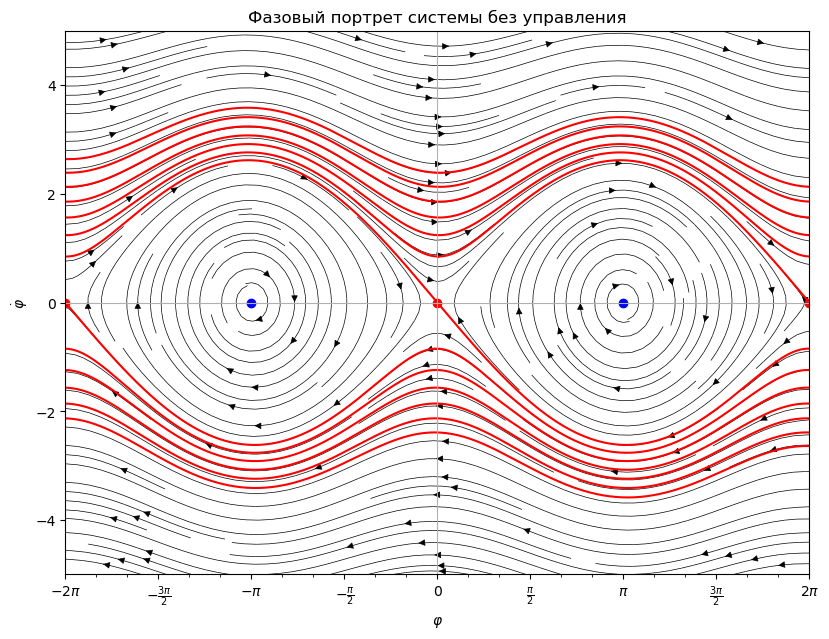

In [145]:
# Определение границ коробки осей
phimin = -2 * pi
phimax = 2 * pi
dphimin = -5
dphimax = 5

# Создание сеток переменных 201 на 201 элемента
phi, dphi = meshgrid(linspace(phimin, phimax, 201),
                     linspace(dphimin, dphimax, 201))

# Вычисление вертикальной компоненты векторного поля (горизонтальная
# компонента равна dphi и её не нужно специально вычислять)
ddphi = p1.omega**2*sin(phi) - p1.nu*dphi

# Построение фазовой плоскости: первые два аргумента задают сетку значений
# абсцисс и ординат, следующие два аргумента задают горизонтальную и
# вертикальную компоненты векторного поля
streamplot(phi, dphi, dphi, ddphi, linewidth=0.5, density=2., color='k')

# Точки устойчивого равновесия
plot([-pi, pi], [0, 0], 'bo')

# Точки неустойчивого равновесия
plot([-2*pi, 0, 2*pi], [0, 0, 0], 'ro')

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей снизу справа
l = 1e-3 # Малый сдвиг относительно седла по горизонтали
pm = -0.5*p1.nu-sqrt(0.25*p1.nu**2+p1.omega**2) # Отрицательный корень
                                                # характеристического полинома
                                                # уравнения, линеаризованного
                                                # около седла
c = LinearStateControl(2, 1)
t1, s1 = integrate(p1, c, x0=[l, l*pm], v0=empty(0), dt=-0.01, T=-50, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей сверху слева
t2, s2 = integrate(p1, c, x0=[-l, -l*pm], v0=empty(0), dt=-0.01, T=-50, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Объединение двух сепартрис в одну кривую
s = vstack([s1[::-1], s2])

# Добавление сепаратрис на график с периодическим повторением по горизонтали
for i in range(-6, 7):
    plot(s[:, 0] + 2*pi*i, s[:, 1], 'r')

axis([phimin, phimax, dphimin, dphimax])
axis_pi_ticks(gca().xaxis, pi/2, pi/6)
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
axvline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'$\varphi$')
ylabel(r'$\dot\varphi$')
title(r'Фазовый портрет системы без управления');

## Пример численного решения уравнения $\sin\varphi = 0.5\varphi$

In [9]:
# Нахождение корня функции sin(phi) - 0.5*phi в интервале (1e-6, pi), на концах
# которого функция принимает значения разных знаков с помощью метода Брента
from scipy.optimize import brentq
brentq(lambda x: sin(x)-0.5*x, 1e-6, pi)

1.895494267033981

## Решение

### 6.1. Фазовый портрет маятника `p1` с управлением  $u = \frac{\Omega^2}2 \varphi$

In [10]:
# Нахождение корня функции sin(phi) - 0.5*phi в интервале (1e-6, pi), на концах
# которого функция принимает значения разных знаков с помощью метода Брента
from scipy.optimize import brentq
brentq(lambda x: sin(x)-0.5*x, 1e-6, pi)

1.895494267033981

*Запишите аналитические выражения для отрицательных корней характеристических полиномов уравнений, линеаризованных около сёдел.*

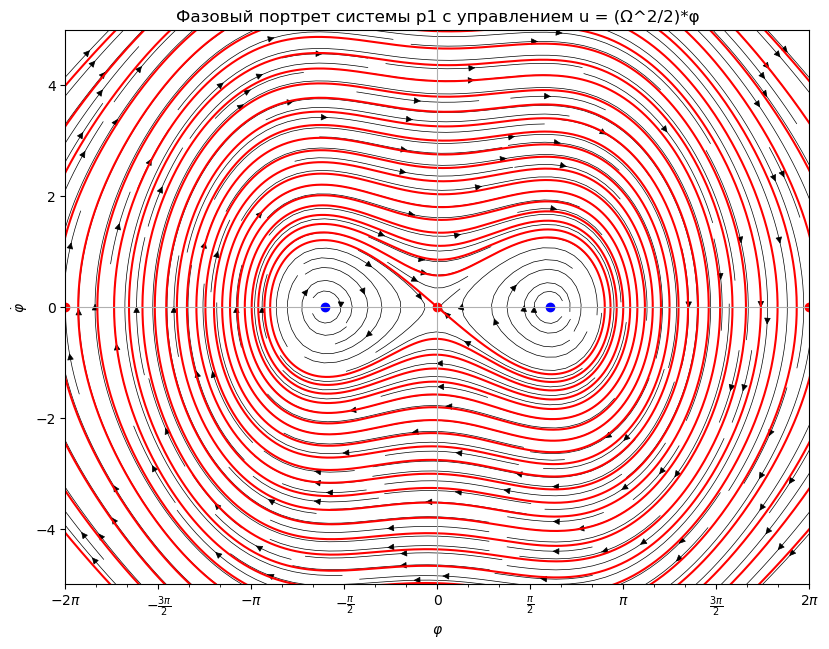

In [184]:
# Определение границ коробки осей
phimin = -2 * pi
phimax = 2 * pi
dphimin = -5
dphimax = 5

# Создание сеток переменных 201 на 201 элемента
phi, dphi = meshgrid(linspace(phimin, phimax, 201),
                     linspace(dphimin, dphimax, 201))

# Вычисление вертикальной компоненты векторного поля (горизонтальная
# компонента равна dphi и её не нужно специально вычислять)
ddphi = -p1.nu*dphi + (p1.omega**2)*sin(phi) - ((p1.omega**2)/2)*phi

# Построение фазовой плоскости: первые два аргумента задают сетку значений
# абсцисс и ординат, следующие два аргумента задают горизонтальную и
# вертикальную компоненты векторного поля
streamplot(phi, dphi, dphi, ddphi, linewidth=0.5, density=2., color='k')

# Точки устойчивого равновесия
plot([-1.895494267033981, 1.895494267033981], [0, 0], 'bo')

# Точки неустойчивого равновесия
plot([-2*pi, 0, 2*pi], [0, 0, 0], 'ro')

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей снизу справа
l = 1e-3 # Малый сдвиг относительно седла по горизонтали
pm = -1 # Отрицательный корень
                                                # характеристического полинома
                                                # уравнения, линеаризованного
                                                # около седла
c = LinearStateControl(2, 1, [(p1.omega**2)/2, 0])
t1, s1 = integrate(p1, c, x0=[l, l*pm], v0=empty(0), dt=-0.01, T=-100, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей сверху слева
t2, s2 = integrate(p1, c, x0=[-l, -l*pm], v0=empty(0), dt=-0.01, T=-100, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Объединение двух сепартрис в одну кривую
s = vstack([s1[::-1], s2])

# Добавление сепаратрис на график с периодическим повторением по горизонтали
plot(s[:, 0], s[:, 1], 'r')

axis([phimin, phimax, dphimin, dphimax])
axis_pi_ticks(gca().xaxis, pi/2, pi/6)
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
axvline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'$\varphi$')
ylabel(r'$\dot\varphi$')
title(r'Фазовый портрет системы p1 с управлением u = (Ω^2/2)*φ');
plt.show();

### 6.2. Фазовый портрет маятника `p1` с управлением  $u = k_0 \varphi$ и устойчивым узлом

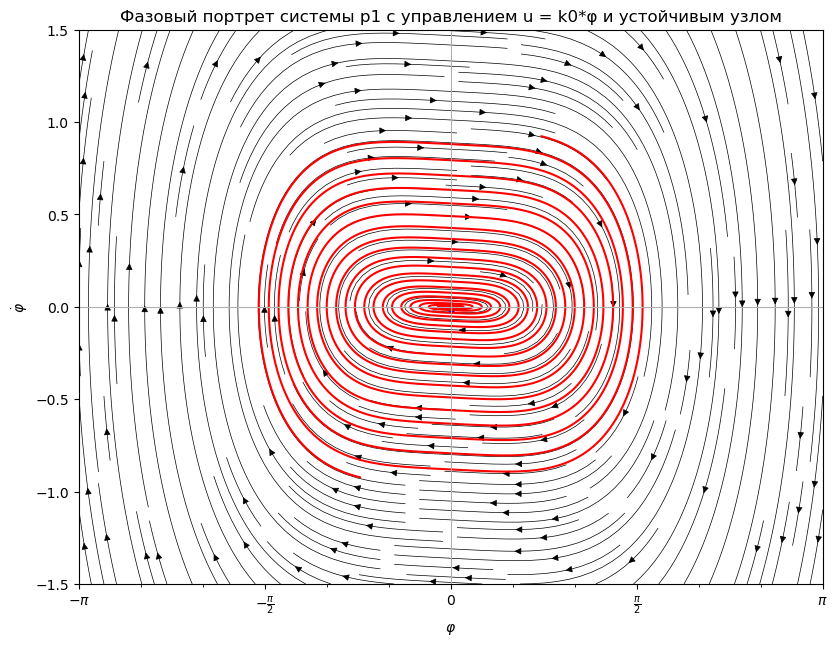

In [183]:
# Определение границ коробки осей
phimin = -pi
phimax = pi
dphimin = -1.5
dphimax = 1.5
k0 = 1.629

# Создание сеток переменных 201 на 201 элемента
phi, dphi = meshgrid(linspace(phimin, phimax, 201),
                     linspace(dphimin, dphimax, 201))

u = k0*phi
# Вычисление вертикальной компоненты векторного поля (горизонтальная
# компонента равна dphi и её не нужно специально вычислять)
ddphi = p1.omega**2*sin(phi) - p1.nu*dphi - u

# Построение фазовой плоскости: первые два аргумента задают сетку значений
# абсцисс и ординат, следующие два аргумента задают горизонтальную и
# вертикальную компоненты векторного поля
streamplot(phi, dphi, dphi, ddphi, linewidth=0.5, density=2., color='k')

# Точки устойчивого равновесия
plot([0, 0], [0, 0], 'bo')

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей снизу справа
l = 1e-3 # Малый сдвиг относительно седла по горизонтали
pm = -0.5*p1.nu-sqrt(0.25*p1.nu**2+p1.omega**2) # Отрицательный корень
                                                # характеристического полинома
                                                # уравнения, линеаризованного
                                                # около седла
c = LinearStateControl(2, 1, [k0, 0])
t1, s1 = integrate(p1, c, x0=[l, l*pm], v0=empty(0), dt=-0.01, T=-300, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей сверху слева
t2, s2 = integrate(p1, c, x0=[-l, -l*pm], v0=empty(0), dt=-0.01, T=-300, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Объединение двух сепартрис в одну кривую
s = vstack([s1[::-1], s2])

# Добавление сепаратрис на график с периодическим повторением по горизонтали
for i in range(0,1):
    plot(s[:, 0] + 2*pi*i, s[:, 1], 'r')

axis([phimin, phimax, dphimin, dphimax])
axis_pi_ticks(gca().xaxis, pi/2, pi/6)
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
axvline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'$\varphi$')
ylabel(r'$\dot\varphi$')
title(r'Фазовый портрет системы p1 с управлением u = k0*φ и устойчивым узлом');
plt.show();

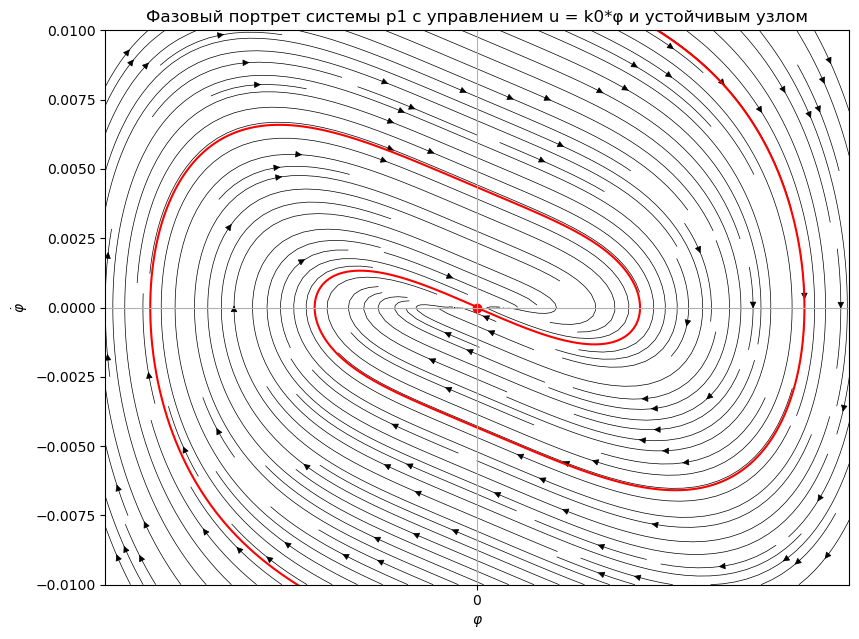

In [182]:
# Определение границ коробки осей
phimin = -pi/18
phimax = pi/18
dphimin = -0.01
dphimax = 0.01
k0 = 1.629

# Создание сеток переменных 201 на 201 элемента
phi, dphi = meshgrid(linspace(phimin, phimax, 201),
                     linspace(dphimin, dphimax, 201))

u = k0*phi
# Вычисление вертикальной компоненты векторного поля (горизонтальная
# компонента равна dphi и её не нужно специально вычислять)
ddphi = p1.omega**2*sin(phi) - p1.nu*dphi - u

# Построение фазовой плоскости: первые два аргумента задают сетку значений
# абсцисс и ординат, следующие два аргумента задают горизонтальную и
# вертикальную компоненты векторного поля
streamplot(phi, dphi, dphi, ddphi, linewidth=0.5, density=2., color='k')

# Точки устойчивого равновесия
#plot([0, 0], [0, 0], 'bo')
plot([0], [0], 'ro')

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей снизу справа
l = 1e-5 # Малый сдвиг относительно седла по горизонтали
pm = -0.5*p1.nu-sqrt(0.25*p1.nu**2+p1.omega**2) # Отрицательный корень
                                                # характеристического полинома
                                                # уравнения, линеаризованного
                                                # около седла
c = LinearStateControl(2, 1, [k0, 0])
t1, s1 = integrate(p1, c, x0=[l, l*pm], v0=empty(0), dt=-0.01, T=-300, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей сверху слева
t2, s2 = integrate(p1, c, x0=[-l, -l*pm], v0=empty(0), dt=-0.01, T=-300, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Объединение двух сепартрис в одну кривую
s = vstack([s1[::-1], s2])

# Добавление сепаратрис на график с периодическим повторением по горизонтали
for i in range(0,1):
    plot(s[:, 0] + 2*pi*i, s[:, 1], 'r')

axis([phimin, phimax, dphimin, dphimax])
axis_pi_ticks(gca().xaxis, pi/2, pi/6)
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
axvline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'$\varphi$')
ylabel(r'$\dot\varphi$')
title(r'Фазовый портрет системы p1 с управлением u = k0*φ и устойчивым узлом');
plt.show();

### 6.3. Фазовый портрет маятника `p1` с управлением  $u = k_0 \varphi$ и устойчивым фокусом

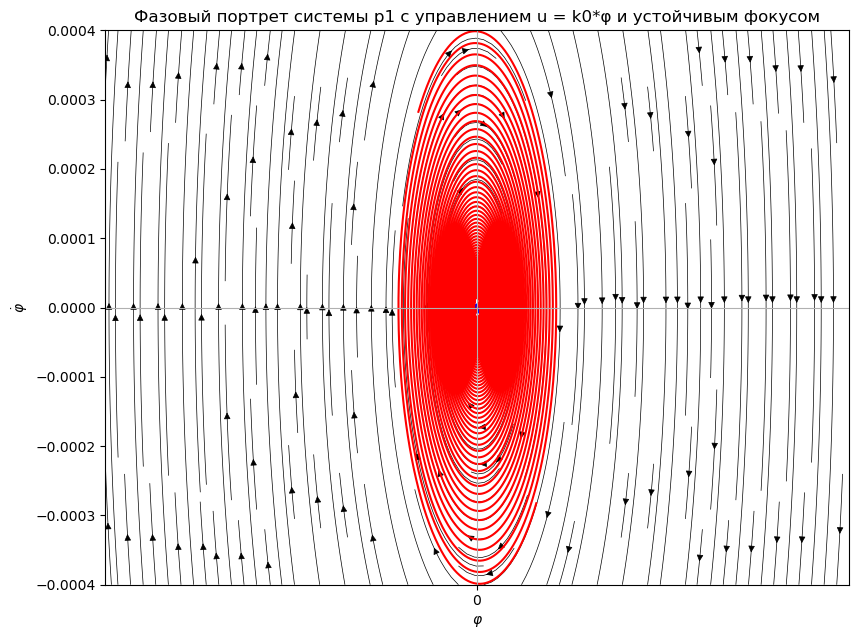

In [181]:
# Определение границ коробки осей
phimin = -pi/2000
phimax = pi/2000
dphimin = -0.0004
dphimax = 0.0004
k0 = 3

# Создание сеток переменных 201 на 201 элемента
phi, dphi = meshgrid(linspace(phimin, phimax, 201),
                     linspace(dphimin, dphimax, 201))

u = k0 * phi
# Вычисление вертикальной компоненты векторного поля (горизонтальная
# компонента равна dphi и её не нужно специально вычислять)
ddphi = p1.omega**2*sin(phi) - p1.nu*dphi - u

# Построение фазовой плоскости: первые два аргумента задают сетку значений
# абсцисс и ординат, следующие два аргумента задают горизонтальную и
# вертикальную компоненты векторного поля
streamplot(phi, dphi, dphi, ddphi, linewidth=0.5, density=2., color='k')

# Точки устойчивого равновесия
plot([0, 0], [0, 0], 'bo')

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей снизу справа
l = 1e-5 # Малый сдвиг относительно седла по горизонтали
pm = 1 # Отрицательный корень
                                                # характеристического полинома
                                                # уравнения, линеаризованного
                                                # около седла
c = LinearStateControl(2, 1, [k0, 0])
t1, s1 = integrate(p1, c, x0=[l, l*pm], v0=empty(0), dt=-0.01, T=-200, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей сверху слева
t2, s2 = integrate(p1, c, x0=[-l, -l*pm], v0=empty(0), dt=-0.01, T=-200, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Объединение двух сепартрис в одну кривую
s = vstack([s1[::-1], s2])

# Добавление сепаратрис на график с периодическим повторением по горизонтали
for i in range(0,1):
    plot(s[:, 0] + 2*pi*i, s[:, 1], 'r')

axis([phimin, phimax, dphimin, dphimax])
axis_pi_ticks(gca().xaxis, pi/2, pi/6)
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
axvline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'$\varphi$')
ylabel(r'$\dot\varphi$')
title(r'Фазовый портрет системы p1 с управлением u = k0*φ и устойчивым фокусом');
plt.show();

### 6.4. Фазовый портрет маятника `p2` с управлением  $u = k_0 \varphi$ и устойчивым узлом

In [149]:
# Нахождение корня функции sin(phi) - 0.5*phi в интервале (1e-6, pi), на концах
# которого функция принимает значения разных знаков с помощью метода Брента
from scipy.optimize import brentq
k0 = 1.6291661359355976
phis=brentq(lambda x: tan(x)-(k0/p2.omega**2)*x, 1e-6, pi/2-0.0001)
print(phis)

0.015631401633750586


*Запишите аналитические выражения для отрицательных корней характеристических полиномов уравнений, линеаризованных около сёдел.*

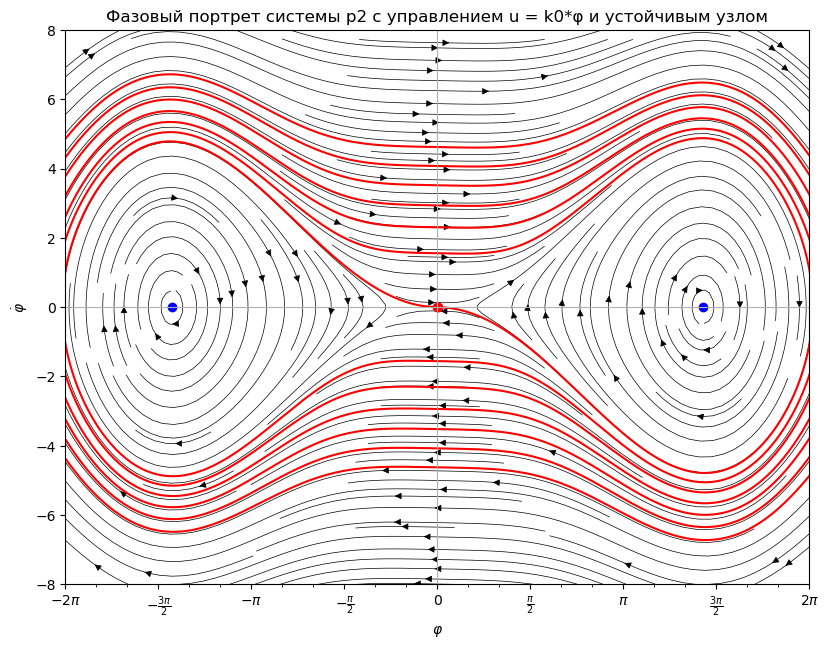

In [158]:
# Определение границ коробки осей
phimin = -2 * pi
phimax = 2 * pi
dphimin = -8
dphimax = 8
k0 = 1.629

# Создание сеток переменных 201 на 201 элемента
phi, dphi = meshgrid(linspace(phimin, phimax, 201),
                     linspace(dphimin, dphimax, 201))

# Вычисление вертикальной компоненты векторного поля (горизонтальная
# компонента равна dphi и её не нужно специально вычислять)
ddphi = p2.omega**2*sin(phi) - k0*cos(phi)*phi - p2.nu*dphi

# Построение фазовой плоскости: первые два аргумента задают сетку значений
# абсцисс и ординат, следующие два аргумента задают горизонтальную и
# вертикальную компоненты векторного поля
streamplot(phi, dphi, dphi, ddphi, linewidth=0.5, density=2., color='k')

# Точки устойчивого равновесия
plot([-3*pi/2+0.23, 3*pi/2-0.23], [0, 0], 'bo')
# Точки неустойчивого равновесия
plot([-phis,phis], [0,0], 'ro')

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей снизу справа
l = 1e-3 # Малый сдвиг относительно седла по горизонтали
pm = -0.5*p2.nu-(sqrt(p2.nu**2+4*(p2.omega**2+k0)))*0.5 # Отрицательный корень
                                                # характеристического полинома
                                                # уравнения, линеаризованного
                                                # около седла
c = LinearStateControl(2, 1, [k0, 0])
t1, s1 = integrate(p2, c, x0=[l, l*pm], v0=empty(0), dt=-0.01, T=-100, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей сверху слева
t2, s2 = integrate(p2, c, x0=[-l, -l*pm], v0=empty(0), dt=-0.01, T=-100, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Объединение двух сепартрис в одну кривую
s = vstack([s1[::-1], s2])

# Добавление сепаратрис на график с периодическим повторением по горизонтали
plot(s[:, 0], s[:, 1], 'r')

axis([phimin, phimax, dphimin, dphimax])
axis_pi_ticks(gca().xaxis, pi/2, pi/6)
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
axvline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'$\varphi$')
ylabel(r'$\dot\varphi$')
title(r'Фазовый портрет системы p2 с управлением u = k0*φ и устойчивым узлом');
plt.show();

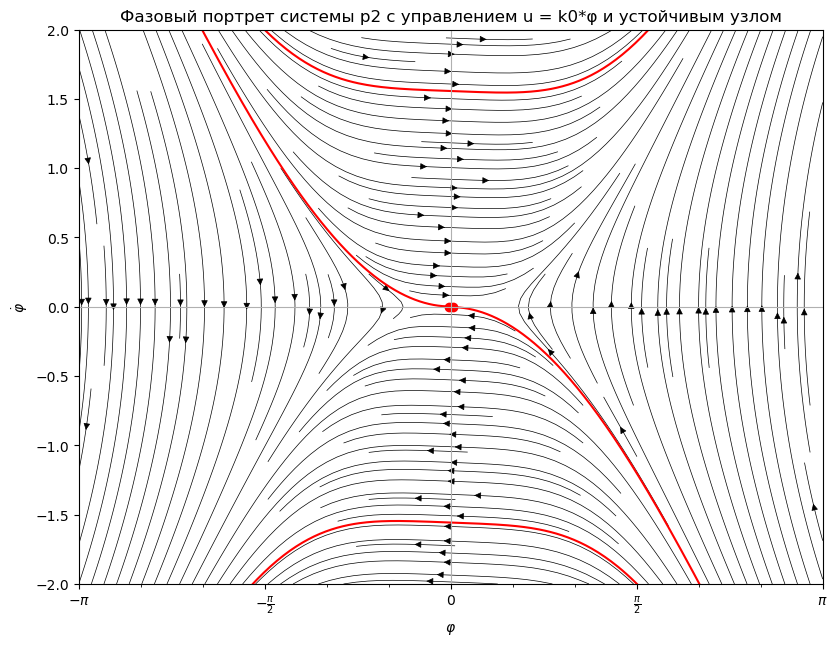

In [166]:
# Определение границ коробки осей
phimin = -pi
phimax = pi
dphimin = -2
dphimax = 2
k0 = 1.629

# Создание сеток переменных 201 на 201 элемента
phi, dphi = meshgrid(linspace(phimin, phimax, 201),
                     linspace(dphimin, dphimax, 201))

# Вычисление вертикальной компоненты векторного поля (горизонтальная
# компонента равна dphi и её не нужно специально вычислять)
ddphi = p2.omega**2*sin(phi) - k0*cos(phi)*phi - p2.nu*dphi

# Построение фазовой плоскости: первые два аргумента задают сетку значений
# абсцисс и ординат, следующие два аргумента задают горизонтальную и
# вертикальную компоненты векторного поля
streamplot(phi, dphi, dphi, ddphi, linewidth=0.5, density=2., color='k')

# Точки устойчивого равновесия
#plot([-3*pi/2+0.23, 3*pi/2-0.23], [0, 0], 'bo')
# Точки неустойчивого равновесия
plot([-phis,phis], [0,0], 'ro')

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей снизу справа
l = 1e-3 # Малый сдвиг относительно седла по горизонтали
pm = -0.5*p2.nu-(sqrt(p2.nu**2+4*(p2.omega**2+k0)))*0.5 # Отрицательный корень
                                                # характеристического полинома
                                                # уравнения, линеаризованного
                                                # около седла
c = LinearStateControl(2, 1, [k0, 0])
t1, s1 = integrate(p2, c, x0=[l, l*pm], v0=empty(0), dt=-0.01, T=-50, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей сверху слева
t2, s2 = integrate(p2, c, x0=[-l, -l*pm], v0=empty(0), dt=-0.01, T=-50, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Объединение двух сепартрис в одну кривую
s = vstack([s1[::-1], s2])

# Добавление сепаратрис на график с периодическим повторением по горизонтали
plot(s[:, 0], s[:, 1], 'r')

axis([phimin, phimax, dphimin, dphimax])
axis_pi_ticks(gca().xaxis, pi/2, pi/6)
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
axvline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'$\varphi$')
ylabel(r'$\dot\varphi$')
title(r'Фазовый портрет системы p2 с управлением u = k0*φ и устойчивым узлом');
plt.show();

### 6.5. Фазовый портрет маятника `p2` с управлением  $u = k_0 \varphi$ и устойчивым фокусом

In [167]:
# Нахождение корня функции sin(phi) - 0.5*phi в интервале (1e-6, pi), на концах
# которого функция принимает значения разных знаков с помощью метода Брента
from scipy.optimize import brentq
k0 = 1.6291661359355976
phis=brentq(lambda x: tan(x)-(k0/p2.omega**2)*x, 1e-6, pi/2-0.0001)
print(phis)

0.015631401633750586


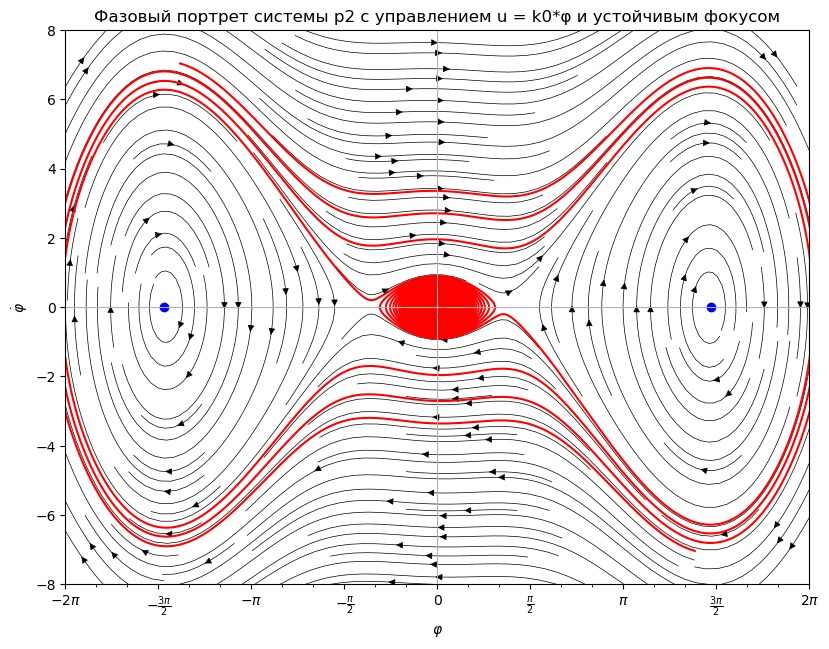

In [180]:
# Определение границ коробки осей
phimin = -2*pi
phimax = 2*pi
dphimin = -8
dphimax = 8
k0 = 3

# Создание сеток переменных 201 на 201 элемента
phi, dphi = meshgrid(linspace(phimin, phimax, 201),
                     linspace(dphimin, dphimax, 201))

# Вычисление вертикальной компоненты векторного поля (горизонтальная
# компонента равна dphi и её не нужно специально вычислять)
ddphi = p2.omega**2*sin(phi) - k0*cos(phi)*phi - p2.nu*dphi

# Построение фазовой плоскости: первые два аргумента задают сетку значений
# абсцисс и ординат, следующие два аргумента задают горизонтальную и
# вертикальную компоненты векторного поля
streamplot(phi, dphi, dphi, ddphi, linewidth=0.5, density=2., color='k')

# Точки устойчивого равновесия
plot([-3*pi/2+0.1, 3*pi/2-0.1], [0, 0], 'bo')
# Точки неустойчивого равновесия
plot([-phis,phis], [0,0], 'ro')

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей снизу справа
l = 1e-3 # Малый сдвиг относительно седла по горизонтали
pm = -0.5*p2.nu-(sqrt(p2.nu**2+4*(p2.omega**2+k0)))*0.5 # Отрицательный корень
                                                # характеристического полинома
                                                # уравнения, линеаризованного
                                                # около седла
c = LinearStateControl(2, 1, [k0, 0])
t1, s1 = integrate(p2, c, x0=[l, l*pm], v0=empty(0), dt=-0.01, T=-400, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Расчёт устойчивой сепаратрисы седла (0, 0), приходящей сверху слева
t2, s2 = integrate(p2, c, x0=[-l, -l*pm], v0=empty(0), dt=-0.01, T=-400, N=1,
                   stop_condition=lambda x, t: abs(x[1]) > 7.)

# Объединение двух сепартрис в одну кривую
s = vstack([s1[::-1], s2])

# Добавление сепаратрис на график с периодическим повторением по горизонтали
plot(s[:, 0], s[:, 1], 'r')

axis([phimin, phimax, dphimin, dphimax])
axis_pi_ticks(gca().xaxis, pi/2, pi/6)
axhline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
axvline(0, lw=rcParams['grid.linewidth'], ls=rcParams['grid.linestyle'],
        c=rcParams['grid.color'])
xlabel(r'$\varphi$')
ylabel(r'$\dot\varphi$')
title(r'Фазовый портрет системы p2 с управлением u = k0*φ и устойчивым фокусом');
plt.show();